# Roget's Thesaurus (Embedding's Class Prediction)

> Konstantinos Mpouros <br>
> Github: https://github.com/konstantinosmpouros <br>
> Year: 2024 <br>

## 1. About the notebook
---

The purpose of this notebook is to performe a part of the hole project (<b>Roget's Thesaurus in the 21st Century</b>) which is the class prediction of the embeddings we created in notebook <b>Roget's Data and Embeddings</b>

This Jupyter Notebook is focused on the application of machine learning and deep learning models to predict the categories of word embeddings previously generated from textual data extracted from Gutenberg's website.

## 2. Libraries
---

In [1]:
# Data Loading, Manipulation and Normalization
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from keras.utils import to_categorical

# Vector DB
import faiss

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_rank

# Split and Reports
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report

# Machine Learning Models and Ensemble Models
from sklearn.linear_model import SGDClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import BaggingClassifier
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier

# Model validation and Hyperparameter tuning
from sklearn.model_selection import cross_val_score
import optuna

# Save the model
from joblib import dump

# Deep learning
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Reshape, Dense, LSTM, GRU, Bidirectional
from tensorflow.keras.layers import LayerNormalization, Add, Dropout, BatchNormalization

# Mixed Presicion
from tensorflow.keras import mixed_precision

# Callbacks and Regularization
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.regularizers import l2

# Visualize the model's architecture
from keras.utils import plot_model

# Helper functions
import helper_functions as hf

2024-09-11 18:10:06.473904: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-11 18:10:06.495629: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-11 18:10:06.495641: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-11 18:10:06.496333: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-09-11 18:10:06.500280: I tensorflow/core/platform/cpu_feature_guar

In [2]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.simplefilter('ignore')
warnings.filterwarnings("ignore", category=ConvergenceWarning)

## 3. Data loading and Preparation

### Words Loading

* Loading the word along with the classes and the embeddings

In [3]:
roget_words = pd.read_csv("Dataset/Roget's_Words.csv")
print(roget_words.shape)
roget_words.head()

(94214, 7)


,Class,Division,Section,Category,Sub-Category,Word,Final_Words
0,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,existence,"Existence, existence"
1,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,being,"Existence, being"
2,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,entity,"Existence, entity"
3,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,ens,"Existence, ens"
4,CLASS I WORDS EXPRESSING ABSTRACT RELATIONS,NaN,SECTION I. EXISTENCE,"Being, in the abstract",Existence,esse,"Existence, esse"


### VectorDB's Embeddings

* Retrieve the vectorDBs and the parameters

In [4]:
index_st = faiss.read_index('Embeddings/ST_vectordb.faiss')
index_use = faiss.read_index('Embeddings/USE_vectordb.faiss')
index_gemma2b = faiss.read_index('Embeddings/Gemma1.1_2B_vectordb.faiss')
index_gemma7b = faiss.read_index('Embeddings/Gemma1.1_7B_vectordb.faiss')

In [5]:
index_st.ntotal, index_use.ntotal, index_gemma2b.ntotal, index_gemma7b.ntotal

(94214, 94214, 94214, 94214)

In [6]:
d_st = index_st.d
d_use = index_use.d
d_gemma2b = index_gemma2b.d
d_gemma7b = index_gemma7b.d

d_st, d_use, d_gemma2b, d_gemma7b

(384, 512, 2048, 3072)

* Retrieve the embeddings

In [7]:
embeddings_st = np.zeros((index_st.ntotal, d_st), dtype=np.float32)
embeddings_use = np.zeros((index_use.ntotal, d_use), dtype=np.float32)
embeddings_gemma2b = np.zeros((index_gemma2b.ntotal, d_gemma2b), dtype=np.float32)
embeddings_gemma7b = np.zeros((index_gemma7b.ntotal, d_gemma7b), dtype=np.float32)

In [8]:
for i in range(index_st.ntotal):
    embeddings_st[i] = index_st.reconstruct(i)
    embeddings_use[i] = index_use.reconstruct(i)
    embeddings_gemma2b[i] = index_gemma2b.reconstruct(i)
    embeddings_gemma7b[i] = index_gemma7b.reconstruct(i)

In [9]:
scaler = StandardScaler()

embeddings_st = scaler.fit_transform(embeddings_st)
embeddings_use = scaler.fit_transform(embeddings_use)
embeddings_gemma2b = scaler.fit_transform(embeddings_gemma2b)
embeddings_gemma7b = scaler.fit_transform(embeddings_gemma7b)

In [10]:
embeddings_st = pd.DataFrame(embeddings_st)
embeddings_use = pd.DataFrame(embeddings_use)
embeddings_gemma2b = pd.DataFrame(embeddings_gemma2b)
embeddings_gemma7b = pd.DataFrame(embeddings_gemma7b)

## 4. Machine Learning

We chose 8 different models to use in the class prediction notebook where with all these model we will follow a specific pattern to find the best parameters and optimize the accuracy. The pattern is the following:

We will first initialize the model without parameters in order to see the score it can hit without any optimization. Then we will use the optuna to modify some of the parameters and find the best combination. If the optuna goes better than the befault then we will take the parameters of the best trial that optuna had and train a model with this parameters. The best model that we will save will be the model with the highest score.

In [11]:
X, y = embeddings_st, roget_words['Class']

In [12]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=33)

### SGD

In [13]:
sgd = SGDClassifier(random_state=33)
sgd.fit(X_train, y_train)

SGDClassifier(random_state=33)

In [14]:
sgd.score(X_test, y_test)

0.3846099416239165

In [15]:
print(classification_report(y_test, sgd.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.38      0.38      0.38      4317
                         CLASS II WORDS RELATING TO SPACE       0.31      0.33      0.32      3819
                       CLASS III WORDS RELATING TO MATTER       0.32      0.32      0.32      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.41      0.42      0.42      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.40      0.43      0.42      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.43      0.38      0.40      5756

                                                 accuracy                           0.38     28265
                                                macro avg       0.38      0.38      0.38     28265
                                             weighted avg       0.39      0.38      0.38     28265



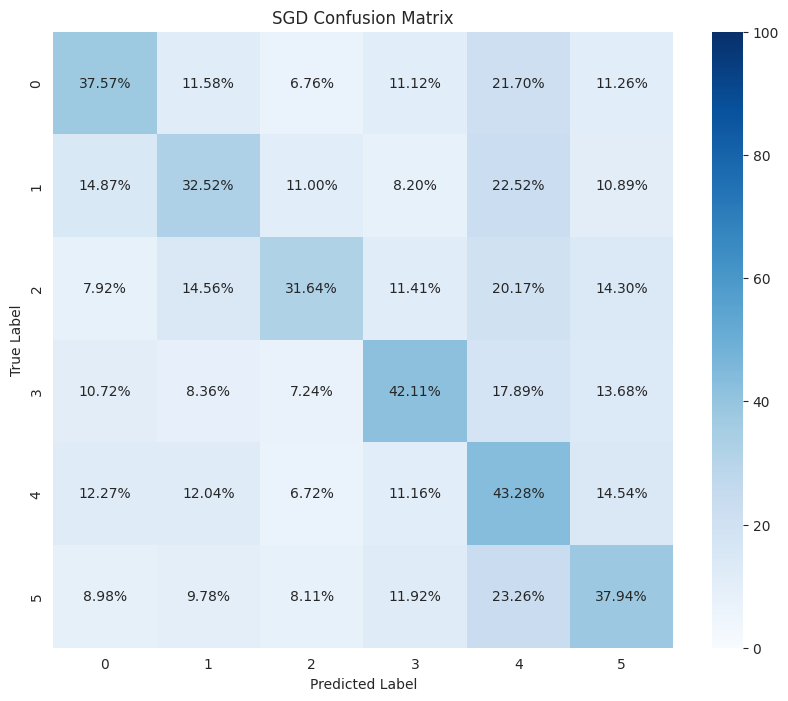

In [16]:
hf.confusion_matrix_plot(y_test, sgd.predict(X_test), 'SGD', 'Class/SGD_cm')

In [17]:
def objective_sgd_class(trial):

    params = {
        'alpha': trial.suggest_float('alpha', 0.01, 1),
        'epsilon': trial.suggest_float('epsilon', 0.01, 1),
        'l1_ratio': trial.suggest_float('l1_ratio', 0.01, 1),
        'penalty': trial.suggest_categorical('penalty', [None, 'l1', 'l2']),
        'warm_start': trial.suggest_categorical('warm_start', [True, False]),
        'max_iter': trial.suggest_int('max_iter', 50, 250),
        'random_state': 33
    }
    
    sgd = SGDClassifier(**params)

    score = cross_val_score(sgd, X_train, y_train.to_numpy(), cv=5, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [18]:
study_sgd = optuna.create_study(direction="maximize")
study_sgd.optimize(objective_sgd_class, n_trials=30, n_jobs=-1)

[I 2024-08-06 21:11:34,344] A new study created in memory with name: no-name-3358e9a7-0d7c-4ab6-9b0a-dc060d45b84a
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/_stochastic_gradient.py:723: ConvergenceWarning: Maximum number of iteration reached before convergence. Consider increasing max_iter to improve the fit.
  warnings.warn(
[I 2024-08-06 21:11:59,457] Trial 11 finished with value: 0.20979757466692178 and parameters: {'alpha': 0.4340469133057123, 'epsilon': 0.023126049504696135, 'l1_ratio': 0.08701544138466531, 'penalty': 'l1', 'warm_start': False, 'max_iter': 73}. Best is trial 11 with value: 0.20979757466692178.
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/linear_model/

In [19]:
print('Best trial:')
trial = study_sgd.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.4062987943809402
Params: 
  alpha: 0.13348816074999825
  epsilon: 0.7329115832870156
  l1_ratio: 0.3120258487849763
  penalty: l2
  warm_start: False
  max_iter: 57


In [20]:
fig = plot_optimization_history(study_sgd)

fig.update_layout(yaxis_range=[0, 1], title="Stochastic Gradient Descent Optuna's Performance")
fig.show()

In [21]:
fig = plot_param_importances(study_sgd)

fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparameter Importance")
fig.show()

In [22]:
fig = plot_rank(study_sgd)
fig.update_layout(title="Stochastic Gradient Descent Optuna's Hyperparams Rank (Objective Value)", width=930, height=650)
fig.show()

In [23]:
sgd_class = SGDClassifier(**trial.params, random_state=33)
sgd_class.fit(X_train, y_train)

SGDClassifier(alpha=0.13348816074999825, epsilon=0.7329115832870156,
              l1_ratio=0.3120258487849763, max_iter=57, random_state=33)

In [24]:
sgd_class.score(X_test, y_test)

0.4015566955598797

In [25]:
print(classification_report(y_test, sgd_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.37      0.37      0.37      4317
                         CLASS II WORDS RELATING TO SPACE       0.43      0.27      0.34      3819
                       CLASS III WORDS RELATING TO MATTER       0.41      0.30      0.35      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.41      0.49      0.45      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.41      0.47      0.44      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.39      0.42      0.40      5756

                                                 accuracy                           0.40     28265
                                                macro avg       0.40      0.39      0.39     28265
                                             weighted avg       0.40      0.40      0.40     28265



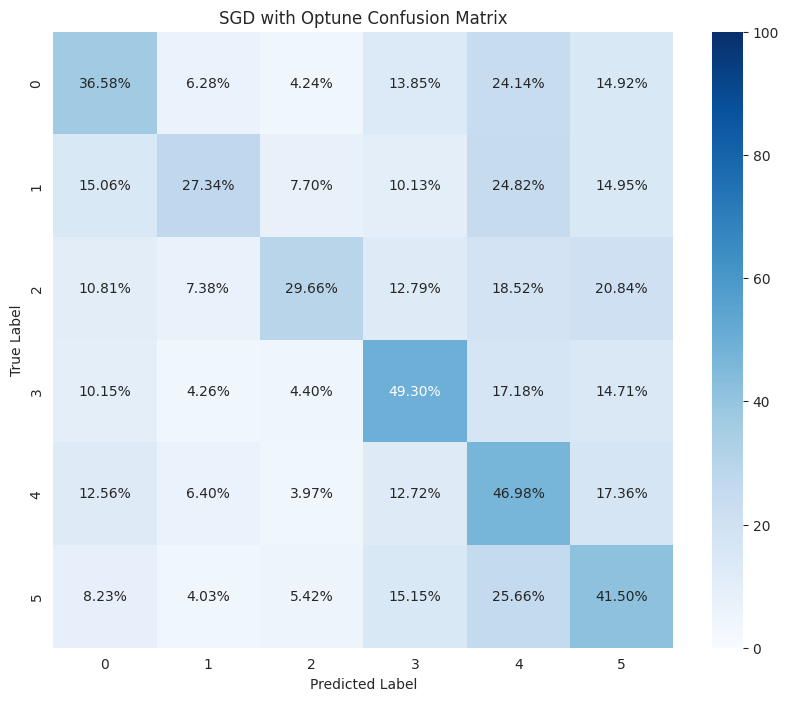

In [26]:
hf.confusion_matrix_plot(y_test, sgd_class.predict(X_test), 'SGD with Optune', 'Class/SGD_cm_optuna')

### SVC

In [27]:
svc = SVC(max_iter=150, random_state=33)
svc.fit(X_train, y_train)

SVC(max_iter=150, random_state=33)

In [28]:
svc.score(X_test, y_test)

0.19012913497258094

In [29]:
print(classification_report(y_test, svc.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.17      0.82      0.28      4317
                         CLASS II WORDS RELATING TO SPACE       0.17      0.13      0.15      3819
                       CLASS III WORDS RELATING TO MATTER       0.22      0.18      0.19      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.33      0.07      0.11      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.37      0.07      0.11      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.50      0.01      0.01      5756

                                                 accuracy                           0.19     28265
                                                macro avg       0.29      0.21      0.14     28265
                                             weighted avg       0.32      0.19      0.13     28265



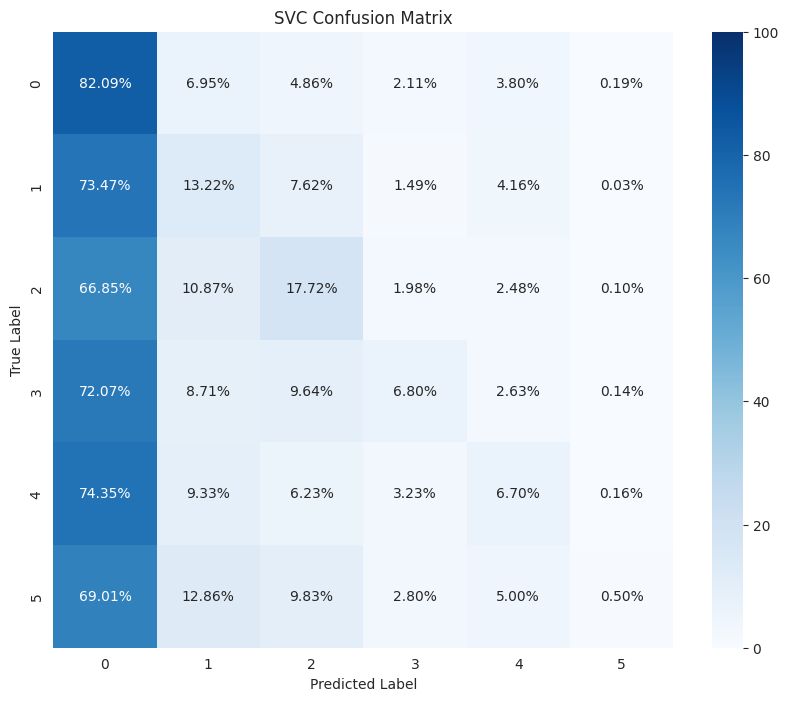

In [30]:
hf.confusion_matrix_plot(y_test, svc.predict(X_test), 'SVC', 'Class/SVC_cm')

In [31]:
def objective_svc_class(trial):
    params = {
        'C': trial.suggest_float('C', 0.01, 1),
        'kernel': trial.suggest_categorical('kernel', ['linear', 'poly', 'rbf']),
        'gamma': trial.suggest_categorical('gamma', ['scale', 'auto']),
        'degree': trial.suggest_int('degree', 2, 6),
        'max_iter': 150,
        'random_state': 33
    }
    
    svc = SVC(**params)

    score = cross_val_score(svc, X_train, y_train.to_numpy(), scoring='accuracy', n_jobs=-1)
    return score.mean()

In [32]:
study_svc = optuna.create_study(direction="maximize")
study_svc.optimize(objective_svc_class, n_trials=30, n_jobs=-1)

[I 2024-08-06 21:15:45,959] A new study created in memory with name: no-name-0901d4aa-6acf-4adc-9fe0-07aa56c6c5e2
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/konstantinosmpouros/.local/lib/python3.10/site-packages/sklearn/svm/_base.py:297: ConvergenceWarning: Solver terminated early (max_iter=150).  Consider pre-processing yo

In [33]:
print('Best trial:')
trial = study_svc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.26681220152042756
Params: 
  C: 0.08907484492428938
  kernel: rbf
  gamma: auto
  degree: 3


In [34]:
fig = plot_optimization_history(study_svc)

fig.update_layout(yaxis_range=[0, 1], title="Support Vector Machine Optuna's Performance")
fig.show()

In [35]:
fig = plot_param_importances(study_svc)

fig.update_layout(title="Support Vector Machine Optuna's Hyperparameter Importance")
fig.show()

In [36]:
fig = plot_rank(study_svc)
fig.update_layout(title="Support Vector Machine Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [37]:
svc_class = SVC(**study_svc.best_trial.params, max_iter=150, random_state=33)
svc_class.fit(X_train, y_train)

SVC(C=0.08907484492428938, gamma='auto', max_iter=150, random_state=33)

In [38]:
svc_class.score(X_test, y_test)

0.23032018397311163

In [39]:
print(classification_report(y_test, svc_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.18      0.66      0.28      4317
                         CLASS II WORDS RELATING TO SPACE       0.25      0.22      0.23      3819
                       CLASS III WORDS RELATING TO MATTER       0.33      0.06      0.10      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.32      0.25      0.28      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.30      0.16      0.21      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.35      0.08      0.13      5756

                                                 accuracy                           0.23     28265
                                                macro avg       0.29      0.24      0.21     28265
                                             weighted avg       0.29      0.23      0.21     28265



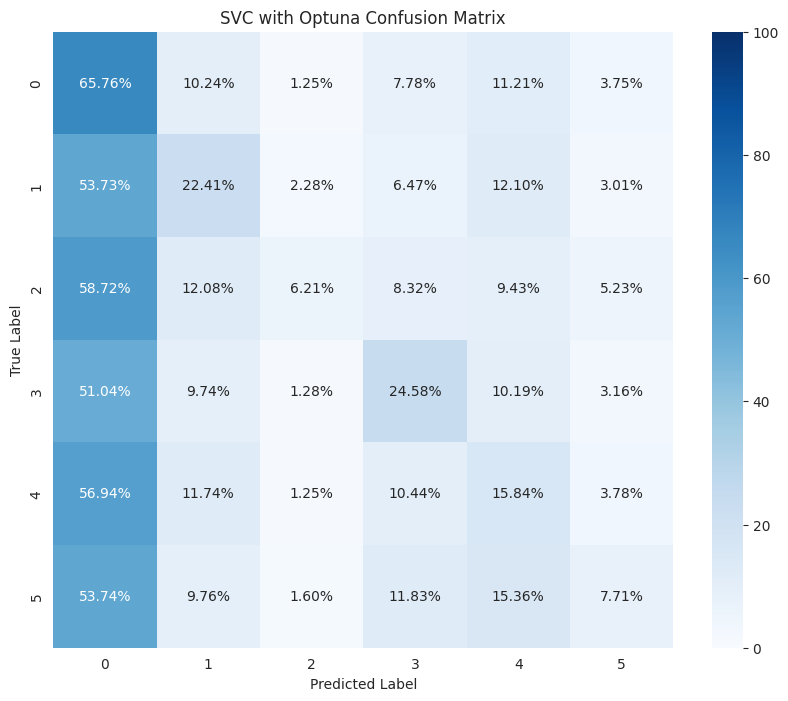

In [40]:
hf.confusion_matrix_plot(y_test, svc_class.predict(X_test), 'SVC with Optuna', 'Class/SVC_cm_optuna')

### Random Forest

In [41]:
rf = RandomForestClassifier(random_state=33)
rf.fit(X_train, y_train)

RandomForestClassifier(random_state=33)

In [42]:
rf.score(X_test, y_test)

0.41623916504510877

In [43]:
print(classification_report(y_test, rf.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.43      0.32      0.37      4317
                         CLASS II WORDS RELATING TO SPACE       0.41      0.28      0.33      3819
                       CLASS III WORDS RELATING TO MATTER       0.42      0.23      0.30      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.47      0.40      0.43      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.39      0.56      0.46      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.42      0.50      0.46      5756

                                                 accuracy                           0.42     28265
                                                macro avg       0.42      0.38      0.39     28265
                                             weighted avg       0.42      0.42      0.41     28265



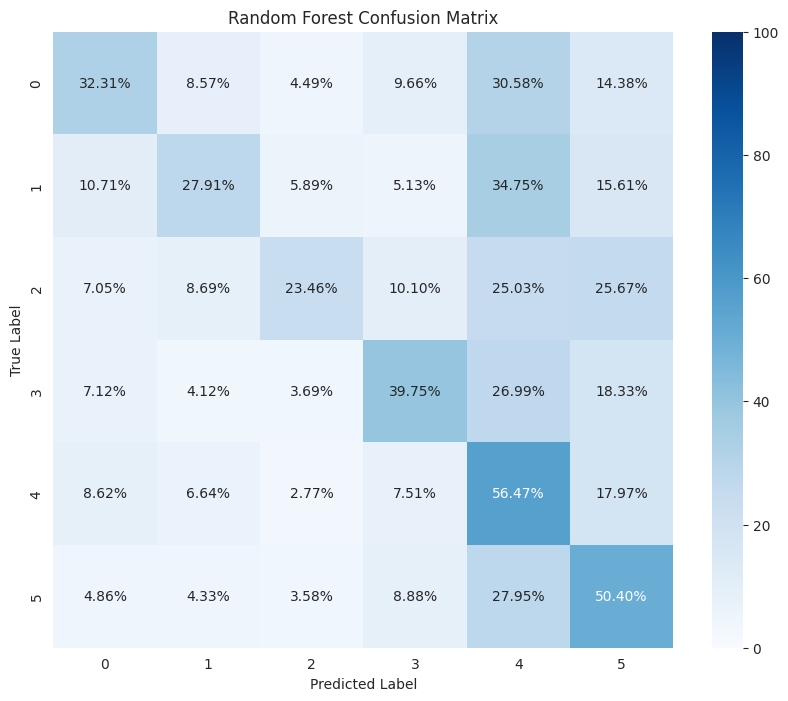

In [44]:
hf.confusion_matrix_plot(y_test, rf.predict(X_test), 'Random Forest', 'Class/RF_cm')

In [45]:
def objective_rf_class(trial):

    params = {
        'n_estimators': trial.suggest_int('n_estimators', low=50, high=250, step=50),
        'max_depth': trial.suggest_int('max_depth', 1, 25),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'n_jobs': -1,
        'random_state': 33
    }
    
    rfc_optuna = RandomForestClassifier(**params)

    score = cross_val_score(rfc_optuna, X_train, y_train, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [46]:
study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(objective_rf_class, n_trials=20, n_jobs=-1)

[I 2024-08-06 21:32:34,394] A new study created in memory with name: no-name-425f0237-cbdb-40fc-996a-05c5f01a888a
[I 2024-08-06 21:33:53,252] Trial 0 finished with value: 0.40819420645469773 and parameters: {'n_estimators': 50, 'max_depth': 16, 'min_samples_split': 3, 'min_samples_leaf': 3, 'bootstrap': False}. Best is trial 0 with value: 0.40819420645469773.
[I 2024-08-06 21:34:15,562] Trial 2 finished with value: 0.4060410187435931 and parameters: {'n_estimators': 50, 'max_depth': 25, 'min_samples_split': 2, 'min_samples_leaf': 1, 'bootstrap': False}. Best is trial 0 with value: 0.40819420645469773.
[I 2024-08-06 21:34:49,151] Trial 1 finished with value: 0.3356229359465187 and parameters: {'n_estimators': 250, 'max_depth': 8, 'min_samples_split': 3, 'min_samples_leaf': 1, 'bootstrap': True}. Best is trial 0 with value: 0.40819420645469773.
[I 2024-08-06 21:35:06,237] Trial 10 finished with value: 0.24737296588106053 and parameters: {'n_estimators': 50, 'max_depth': 2, 'min_samples_s

In [47]:
print('Best trial:')
trial = study_rf.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.4231603529740909
Params: 
  n_estimators: 200
  max_depth: 18
  min_samples_split: 10
  min_samples_leaf: 4
  bootstrap: False


In [48]:
fig = plot_optimization_history(study_rf)

fig.update_layout(yaxis_range=[0, 1], title="Random Forest Optuna's Performance")
fig.show()

In [49]:
fig = plot_param_importances(study_rf)

fig.update_layout(title="Random Forest Optuna's Hyperparameter Importance")
fig.show()

In [50]:
fig = plot_rank(study_rf)
fig.update_layout(title="Random Forest Optuna's Hyperparams Rank (Objective Value)", width=930, height=550)
fig.show()

In [51]:
rf_class = RandomForestClassifier(**study_rf.best_trial.params, random_state=33, n_jobs=-1)
rf_class.fit(X_train, y_train)

RandomForestClassifier(bootstrap=False, max_depth=18, min_samples_leaf=4,
                       min_samples_split=10, n_estimators=200, n_jobs=-1,
                       random_state=33)

In [52]:
rf_class.score(X_test, y_test)

0.43240757120113216

In [53]:
print(classification_report(y_test, rf_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.47      0.32      0.38      4317
                         CLASS II WORDS RELATING TO SPACE       0.45      0.28      0.35      3819
                       CLASS III WORDS RELATING TO MATTER       0.48      0.25      0.32      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.51      0.39      0.44      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.39      0.61      0.47      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.43      0.53      0.48      5756

                                                 accuracy                           0.43     28265
                                                macro avg       0.45      0.40      0.41     28265
                                             weighted avg       0.45      0.43      0.42     28265



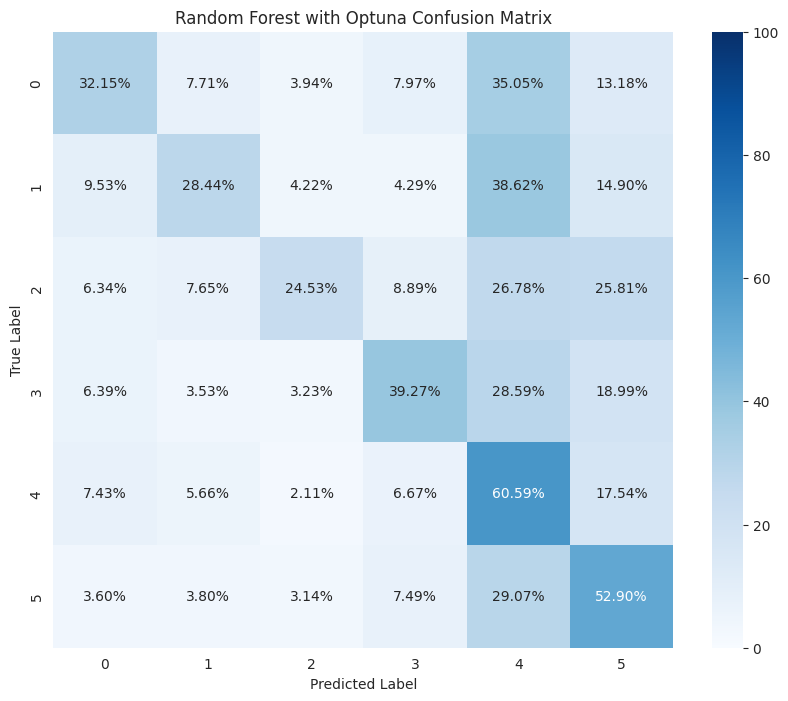

In [54]:
hf.confusion_matrix_plot(y_test, rf_class.predict(X_test), 'Random Forest with Optuna', 'Class/RF_cm_optuna')

### AdaBoost

In [55]:
adaboost = AdaBoostClassifier(random_state=33)
adaboost.fit(X_train, y_train)

AdaBoostClassifier(random_state=33)

In [56]:
adaboost.score(X_test, y_test)

0.3386166637183796

In [57]:
print(classification_report(y_test, adaboost.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.35      0.25      0.29      4317
                         CLASS II WORDS RELATING TO SPACE       0.32      0.28      0.30      3819
                       CLASS III WORDS RELATING TO MATTER       0.28      0.25      0.27      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.36      0.29      0.32      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.36      0.45      0.40      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.33      0.39      0.36      5756

                                                 accuracy                           0.34     28265
                                                macro avg       0.33      0.32      0.32     28265
                                             weighted avg       0.34      0.34      0.33     28265



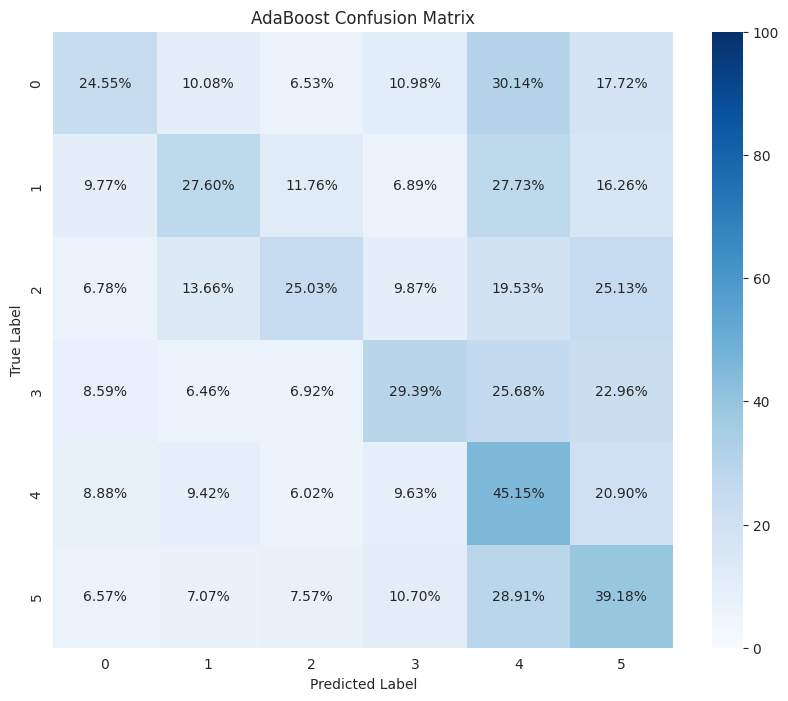

In [58]:
hf.confusion_matrix_plot(y_test, adaboost.predict(X_test), 'AdaBoost', 'Class/AdaBoost_cm')

In [59]:
def objective_ada_class(trial):
    # params_estimator = {
    #     'max_depth': trial.suggest_int('max_depth', 1, 20),
    #     'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
    #     'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),
    #     'max_features': trial.suggest_categorical('max_features', ['auto', 'sqrt', 'log2', None]),
    #     'random_state': 33        
    # }

    # estimator = DecisionTreeClassifier(**params_estimator)
    
    params = {
        # 'estimator': estimator,
        'n_estimators': trial.suggest_int('n_estimators', 50, 200, step=50),
        'algorithm': trial.suggest_categorical('algorithm', ['SAMME']),
        # 'learning_rate': trial.suggest_float('learning_rate', .01, .05),
        'random_state': 33
    }
    adaboost = AdaBoostClassifier(**params)
    
    score = cross_val_score(adaboost,
                            X_train,
                            y_train,
                            scoring='accuracy',
                            cv=5,
                            n_jobs=-1)

    return score.mean()

In [60]:
study_adaboost = optuna.create_study(direction='maximize')
study_adaboost.optimize(objective_ada_class, n_trials=10, n_jobs=-1)

[I 2024-08-06 21:46:44,303] A new study created in memory with name: no-name-628f3216-fba3-4d89-bb2a-95d4e97cba8a
[I 2024-08-06 21:51:10,754] Trial 7 finished with value: 0.3297395864440299 and parameters: {'n_estimators': 100, 'algorithm': 'SAMME'}. Best is trial 7 with value: 0.3297395864440299.
[I 2024-08-06 21:57:56,663] Trial 5 finished with value: 0.3424767451866607 and parameters: {'n_estimators': 150, 'algorithm': 'SAMME'}. Best is trial 5 with value: 0.3424767451866607.
[I 2024-08-06 21:59:45,703] Trial 6 finished with value: 0.3028097299591045 and parameters: {'n_estimators': 50, 'algorithm': 'SAMME'}. Best is trial 5 with value: 0.3424767451866607.
[I 2024-08-06 21:59:51,050] Trial 2 finished with value: 0.3297395864440299 and parameters: {'n_estimators': 100, 'algorithm': 'SAMME'}. Best is trial 5 with value: 0.3424767451866607.
[I 2024-08-06 22:03:58,685] Trial 8 finished with value: 0.3297395864440299 and parameters: {'n_estimators': 100, 'algorithm': 'SAMME'}. Best is tr

In [61]:
print('Best trial:')
trial = study_adaboost.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.35033123669867333
Params: 
  n_estimators: 200
  algorithm: SAMME


In [62]:
trials_df = study_adaboost.trials_dataframe()
trials_df.sort_values(by='value', ascending=False)

,number,value,datetime_start,datetime_complete,duration,params_algorithm,params_n_estimators,state
1,1,0.350331,2024-08-06 21:46:44.321893,2024-08-06 22:04:00.721524,0 days 00:17:16.399631,SAMME,200,COMPLETE
3,3,0.350331,2024-08-06 21:46:44.357398,2024-08-06 22:06:09.577349,0 days 00:19:25.219951,SAMME,200,COMPLETE
9,9,0.342477,2024-08-06 21:46:44.447347,2024-08-06 22:04:25.600610,0 days 00:17:41.153263,SAMME,150,COMPLETE
5,5,0.342477,2024-08-06 21:46:44.375900,2024-08-06 21:57:56.663569,0 days 00:11:12.287669,SAMME,150,COMPLETE
0,0,0.329740,2024-08-06 21:46:44.305328,2024-08-06 22:04:09.582753,0 days 00:17:25.277425,SAMME,100,COMPLETE
2,2,0.329740,2024-08-06 21:46:44.323783,2024-08-06 21:59:51.050401,0 days 00:13:06.726618,SAMME,100,COMPLETE
4,4,0.329740,2024-08-06 21:46:44.374975,2024-08-06 22:06:09.679102,0 days 00:19:25.304127,SAMME,100,COMPLETE
7,7,0.329740,2024-08-06 21:46:44.411402,2024-08-06 21:51:10.753767,0 days 00:04:26.342365,SAMME,100,COMPLETE
8,8,0.329740,2024-08-06 21:46:44.413598,2024-08-06 22:03:58.685321,0 days 00:17:14.271723,SAMME,100,COMPLETE
6,6,0.302810,2024-08-06 21:46:44.410108,2024-08-06 21:59:45.703522,0 days 00:13:01.293414,SAMME,50,COMPLETE


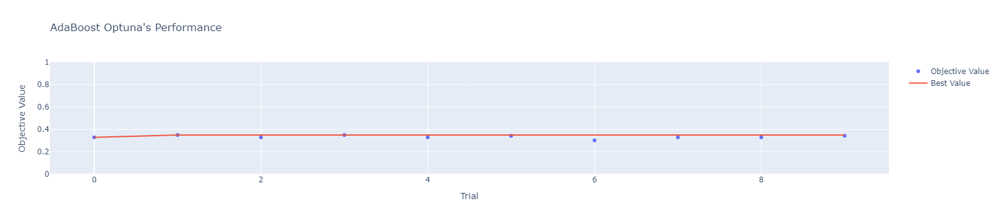

In [63]:
fig = plot_optimization_history(study_adaboost)
fig.update_layout(yaxis_range=[0, 1], title="AdaBoost Optuna's Performance")
fig.show()

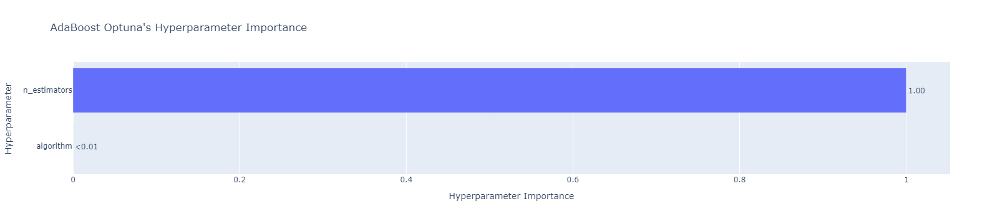

In [64]:
fig = plot_param_importances(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparameter Importance")
fig.show()

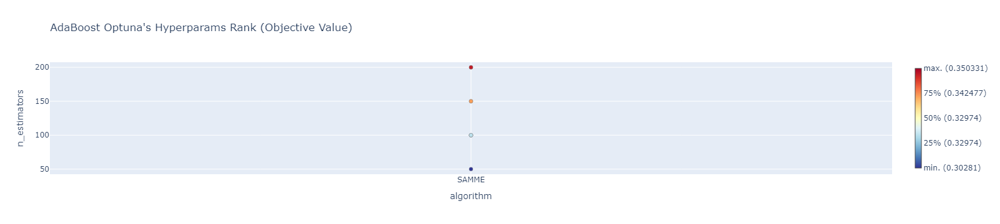

In [65]:
fig = plot_rank(study_adaboost)
fig.update_layout(title="AdaBoost Optuna's Hyperparams Rank (Objective Value)")
fig.show()

In [66]:
adaboost_class = AdaBoostClassifier(**study_adaboost.best_trial.params)
adaboost_class.fit(X_train, y_train)

AdaBoostClassifier(algorithm='SAMME', n_estimators=200)

In [67]:
adaboost_class.score(X_test, y_test)

0.35489120820803116

In [68]:
print(classification_report(y_test, adaboost_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.36      0.27      0.31      4317
                         CLASS II WORDS RELATING TO SPACE       0.35      0.21      0.26      3819
                       CLASS III WORDS RELATING TO MATTER       0.35      0.19      0.25      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.38      0.30      0.34      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.35      0.53      0.42      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.35      0.43      0.38      5756

                                                 accuracy                           0.35     28265
                                                macro avg       0.36      0.32      0.33     28265
                                             weighted avg       0.36      0.35      0.34     28265



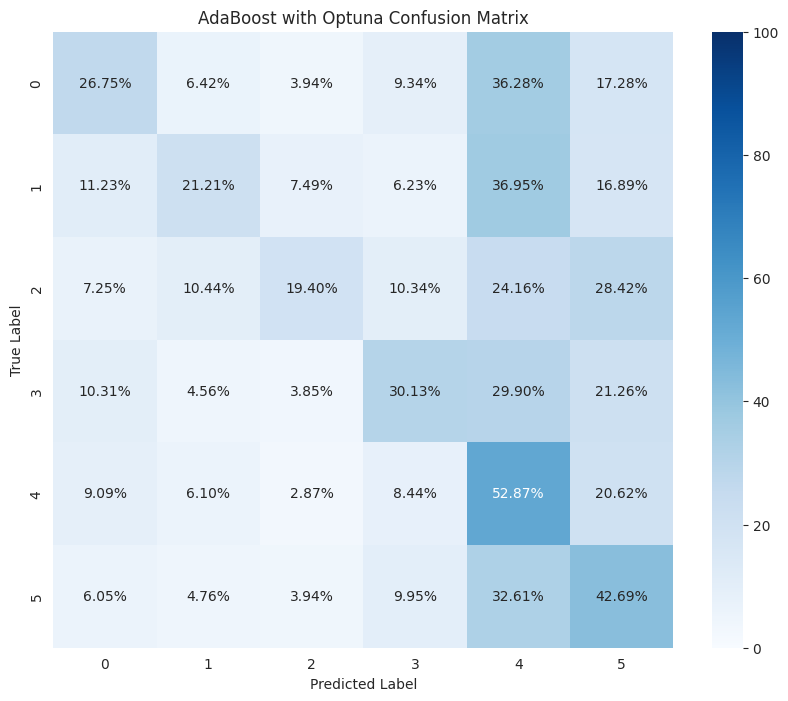

In [69]:
hf.confusion_matrix_plot(y_test, adaboost_class.predict(X_test), 'AdaBoost with Optuna', 'Class/AdaBoost_cm_optuna')

### Extra Trees

In [70]:
etc = ExtraTreesClassifier()
etc.fit(X_train, y_train)

ExtraTreesClassifier()

In [71]:
etc.score(X_test, y_test)

0.4129842561471785

In [72]:
print(classification_report(y_test, etc.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.41      0.35      0.38      4317
                         CLASS II WORDS RELATING TO SPACE       0.40      0.29      0.34      3819
                       CLASS III WORDS RELATING TO MATTER       0.41      0.24      0.31      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.47      0.40      0.43      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.39      0.54      0.45      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.43      0.48      0.45      5756

                                                 accuracy                           0.41     28265
                                                macro avg       0.42      0.38      0.39     28265
                                             weighted avg       0.42      0.41      0.41     28265



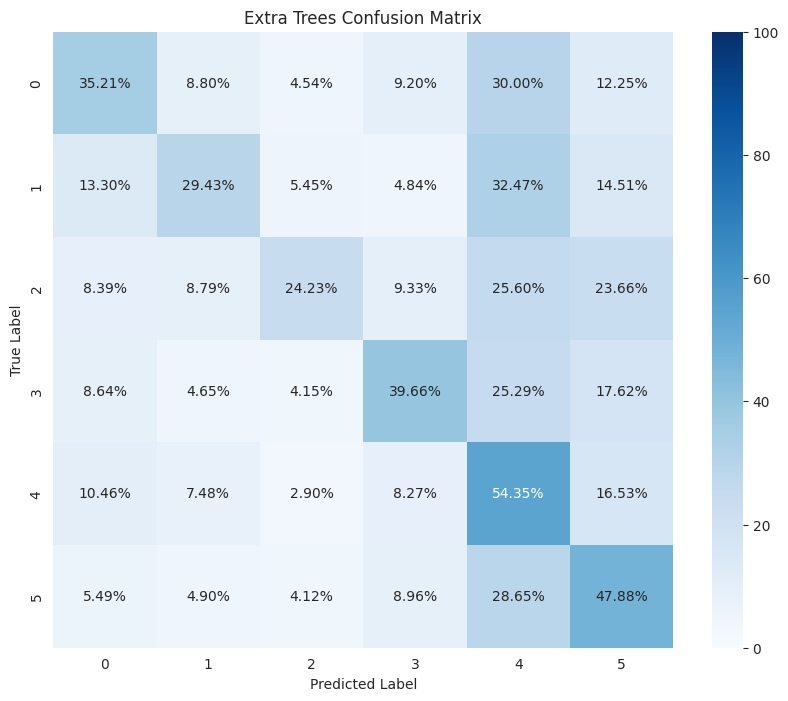

In [73]:
hf.confusion_matrix_plot(y_test, etc.predict(X_test), 'Extra Trees', 'Class/ExtraTrees_cm')

In [74]:
def objective_etc_class(trial):
    max_depth_categ = np.linspace(5, 25, 10).astype(int).tolist()
    max_depth_categ.append(None)

    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=25),
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy', 'log_loss']),
        'max_depth': trial.suggest_categorical('max_depth', max_depth_categ),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 4),
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2']),
    }
    etc_optuna = ExtraTreesClassifier(**params)

    score = cross_val_score(etc_optuna, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [75]:
study_etc = optuna.create_study(direction='maximize')
study_etc.optimize(objective_etc_class, n_trials=30)

[I 2024-08-06 22:15:03,799] A new study created in memory with name: no-name-37dc3ef6-75dd-4901-b78b-14b4107689c2
[I 2024-08-06 22:15:08,280] Trial 0 finished with value: 0.3752748335835267 and parameters: {'n_estimators': 50, 'criterion': 'gini', 'max_depth': 22, 'min_samples_split': 2, 'max_features': 'log2'}. Best is trial 0 with value: 0.3752748335835267.
[I 2024-08-06 22:15:12,270] Trial 1 finished with value: 0.2584421295243294 and parameters: {'n_estimators': 100, 'criterion': 'gini', 'max_depth': 5, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 0 with value: 0.3752748335835267.
[I 2024-08-06 22:15:24,723] Trial 2 finished with value: 0.39213634778389367 and parameters: {'n_estimators': 75, 'criterion': 'log_loss', 'max_depth': 25, 'min_samples_split': 2, 'max_features': 'sqrt'}. Best is trial 2 with value: 0.39213634778389367.
[I 2024-08-06 22:15:29,197] Trial 3 finished with value: 0.2993676932174862 and parameters: {'n_estimators': 75, 'criterion': 'log_loss'

In [76]:
print('Best trial:')
trial = study_etc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.41169691731489483
Params: 
  n_estimators: 225
  criterion: gini
  max_depth: 25
  min_samples_split: 4
  max_features: sqrt


In [77]:
trials_df = study_etc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_criterion,params_max_depth,params_max_features,params_min_samples_split,params_n_estimators,state
24,24,0.411697,2024-08-06 22:23:18.665129,2024-08-06 22:23:47.394771,0 days 00:00:28.729642,gini,25.0,sqrt,4,225,COMPLETE
25,25,0.410711,2024-08-06 22:23:47.395602,2024-08-06 22:24:15.833397,0 days 00:00:28.437795,gini,25.0,sqrt,4,225,COMPLETE
22,22,0.410211,2024-08-06 22:22:17.257764,2024-08-06 22:22:49.603246,0 days 00:00:32.345482,gini,NaN,sqrt,4,250,COMPLETE
23,23,0.409983,2024-08-06 22:22:49.604134,2024-08-06 22:23:18.664284,0 days 00:00:29.060150,gini,NaN,sqrt,4,225,COMPLETE
26,26,0.409089,2024-08-06 22:24:15.834325,2024-08-06 22:24:37.671620,0 days 00:00:21.837295,gini,25.0,sqrt,4,175,COMPLETE


In [78]:
fig = plot_optimization_history(study_etc)
fig.update_layout(yaxis_range=[0, 1], title="Extra Tree Optuna's Performance", width=930, height=550)
fig.show()

In [79]:
fig = plot_param_importances(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

In [80]:
fig = plot_rank(study_etc)
fig.update_layout(title="Extra Tree Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [81]:
etc_class = ExtraTreesClassifier(**study_etc.best_trial.params)
etc_class.fit(X_train, y_train)

ExtraTreesClassifier(max_depth=25, min_samples_split=4, n_estimators=225)

In [82]:
etc_class.score(X_test, y_test)

0.4294356978595436

In [83]:
print(classification_report(y_test, etc_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.48      0.31      0.37      4317
                         CLASS II WORDS RELATING TO SPACE       0.45      0.27      0.33      3819
                       CLASS III WORDS RELATING TO MATTER       0.48      0.23      0.31      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.52      0.40      0.45      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.38      0.62      0.47      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.44      0.52      0.47      5756

                                                 accuracy                           0.43     28265
                                                macro avg       0.46      0.39      0.40     28265
                                             weighted avg       0.45      0.43      0.42     28265



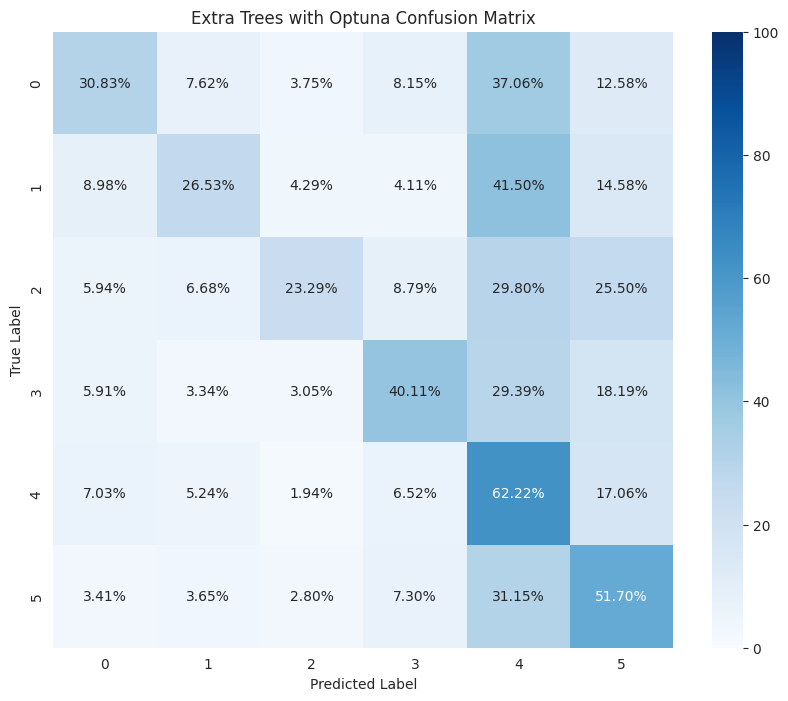

In [84]:
hf.confusion_matrix_plot(y_test, etc_class.predict(X_test), 'Extra Trees with Optuna', 'Class/ExtraTrees_cm_optuna')

### Bagging Classifier

In [85]:
bgc = BaggingClassifier()
bgc.fit(X_train, y_train)

BaggingClassifier()

In [86]:
bgc.score(X_test, y_test)

0.36776932602158147

In [87]:
print(classification_report(y_test, bgc.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.34      0.33      0.33      4317
                         CLASS II WORDS RELATING TO SPACE       0.34      0.31      0.32      3819
                       CLASS III WORDS RELATING TO MATTER       0.33      0.25      0.29      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.37      0.36      0.36      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.39      0.44      0.41      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.40      0.42      0.41      5756

                                                 accuracy                           0.37     28265
                                                macro avg       0.36      0.35      0.35     28265
                                             weighted avg       0.37      0.37      0.37     28265



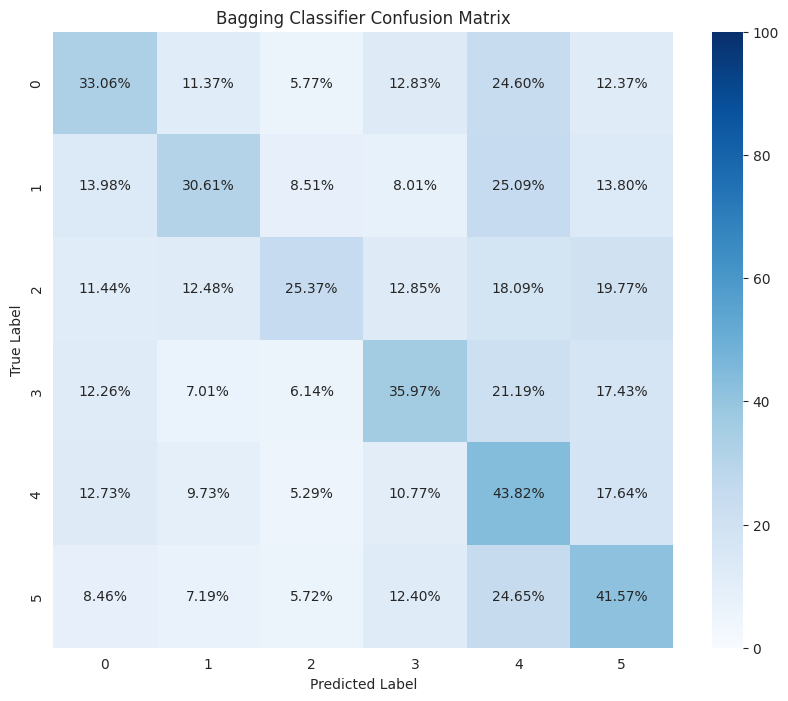

In [88]:
hf.confusion_matrix_plot(y_test, bgc.predict(X_test), 'Bagging Classifier', 'Class/BaggingClf_cm')

In [89]:
def objective_bgc_class(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 200, step=50),
        'max_samples': trial.suggest_float('max_samples', 0.1, 0.6),
        'max_features': trial.suggest_float('max_features', 0.1, 0.6),
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        'bootstrap_features': trial.suggest_categorical('bootstrap_features', [True, False]),
        'random_state': 33,
        'n_jobs': -1
    }

    bgc = BaggingClassifier(**params)

    score = cross_val_score(bgc, X_train, y_train, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [90]:
study_bgc = optuna.create_study(direction='maximize')
study_bgc.optimize(objective_bgc_class, n_trials=10)

[I 2024-08-06 22:29:06,249] A new study created in memory with name: no-name-97629dbd-9339-44ae-b19f-5247089a24a5
[I 2024-08-06 22:29:49,180] Trial 0 finished with value: 0.3948960560433062 and parameters: {'n_estimators': 200, 'max_samples': 0.18214892424797294, 'max_features': 0.3135727484934986, 'bootstrap': True, 'bootstrap_features': False}. Best is trial 0 with value: 0.3948960560433062.
[I 2024-08-06 22:31:52,261] Trial 1 finished with value: 0.4053131965609789 and parameters: {'n_estimators': 100, 'max_samples': 0.584763314516838, 'max_features': 0.456957445213494, 'bootstrap': False, 'bootstrap_features': True}. Best is trial 1 with value: 0.4053131965609789.
[I 2024-08-06 22:32:17,757] Trial 2 finished with value: 0.3850551183490272 and parameters: {'n_estimators': 150, 'max_samples': 0.15911530546231797, 'max_features': 0.26966534776408946, 'bootstrap': True, 'bootstrap_features': True}. Best is trial 1 with value: 0.4053131965609789.
[I 2024-08-06 22:32:58,157] Trial 3 fini

In [91]:
print('Best trial:')
trial = study_bgc.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.4053131965609789
Params: 
  n_estimators: 100
  max_samples: 0.584763314516838
  max_features: 0.456957445213494
  bootstrap: False
  bootstrap_features: True


In [92]:
trials_df = study_bgc.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_bootstrap,params_bootstrap_features,params_max_features,params_max_samples,params_n_estimators,state
1,1,0.405313,2024-08-06 22:29:49.182071,2024-08-06 22:31:52.260752,0 days 00:02:03.078681,False,True,0.456957,0.584763,100,COMPLETE
9,9,0.400597,2024-08-06 22:35:51.103556,2024-08-06 22:37:03.003424,0 days 00:01:11.899868,False,True,0.377201,0.297522,150,COMPLETE
7,7,0.399157,2024-08-06 22:34:48.863428,2024-08-06 22:35:43.587789,0 days 00:00:54.724361,False,False,0.288555,0.419427,100,COMPLETE
6,6,0.395639,2024-08-06 22:33:50.003773,2024-08-06 22:34:48.862476,0 days 00:00:58.858703,True,False,0.590112,0.263046,100,COMPLETE
0,0,0.394896,2024-08-06 22:29:06.250681,2024-08-06 22:29:49.180318,0 days 00:00:42.929637,True,False,0.313573,0.182149,200,COMPLETE


In [93]:
fig = plot_optimization_history(study_bgc)
fig.update_layout(yaxis_range=[0, 1], title="Bagging Classifier Optuna's Performance", width=930, height=550)
fig.show()

In [94]:
fig = plot_param_importances(study_bgc)
fig.update_layout(title="Bagging Classifier Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

In [95]:
fig = plot_rank(study_bgc)
fig.update_layout(title="Bagging Classifier Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [96]:
bgc_class = BaggingClassifier(**study_bgc.best_trial.params)
bgc_class.fit(X_train, y_train)

BaggingClassifier(bootstrap=False, bootstrap_features=True,
                  max_features=0.456957445213494, max_samples=0.584763314516838,
                  n_estimators=100)

In [97]:
bgc_class.score(X_test, y_test)

0.4202016628338935

In [98]:
print(classification_report(y_test, bgc_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.44      0.33      0.38      4317
                         CLASS II WORDS RELATING TO SPACE       0.42      0.30      0.35      3819
                       CLASS III WORDS RELATING TO MATTER       0.44      0.26      0.33      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.47      0.41      0.43      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.39      0.55      0.46      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.42      0.50      0.46      5756

                                                 accuracy                           0.42     28265
                                                macro avg       0.43      0.39      0.40     28265
                                             weighted avg       0.43      0.42      0.41     28265



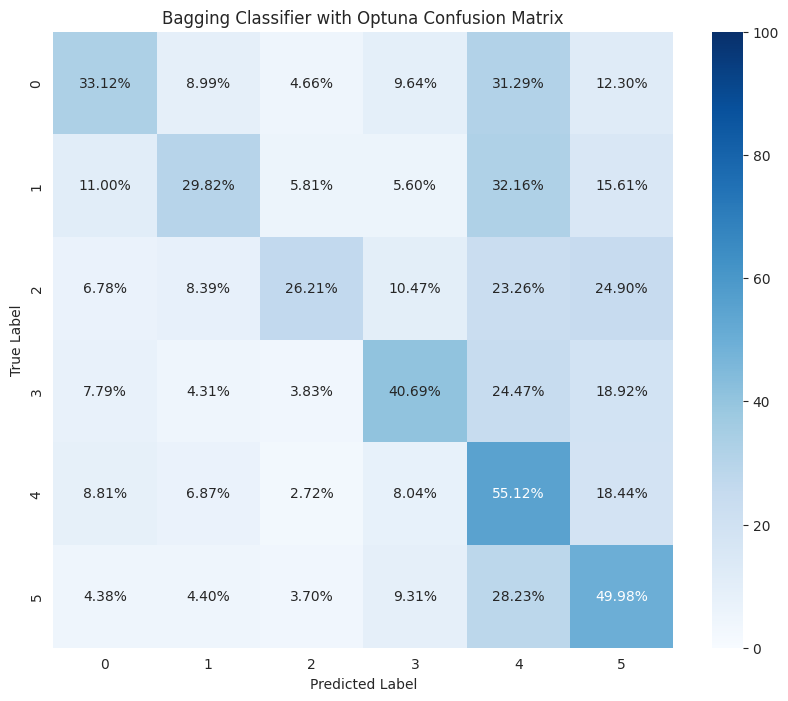

In [99]:
hf.confusion_matrix_plot(y_test, bgc_class.predict(X_test), 'Bagging Classifier with Optuna', 'Class/BaggingClf_cm_optuna')

### XGBoost

In [100]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit the encoder to the class labels and transform them to numeric labels
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.fit_transform(y_test)

In [101]:
xgboost = XGBClassifier(use_label_encoder=False, n_jobs=-1, random_state=33)
xgboost.fit(X_train, y_train_encoded)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [102]:
xgboost.score(X_test, y_test_encoded)

0.4560764196002123

In [103]:
print(classification_report(y_test_encoded, xgboost.predict(X_test)))

              precision    recall  f1-score   support

           0       0.46      0.39      0.42      4317
           1       0.44      0.38      0.41      3819
           2       0.44      0.36      0.39      2980
           3       0.50      0.47      0.48      4365
           4       0.45      0.52      0.48      7028
           5       0.45      0.51      0.48      5756

    accuracy                           0.46     28265
   macro avg       0.46      0.44      0.45     28265
weighted avg       0.46      0.46      0.45     28265



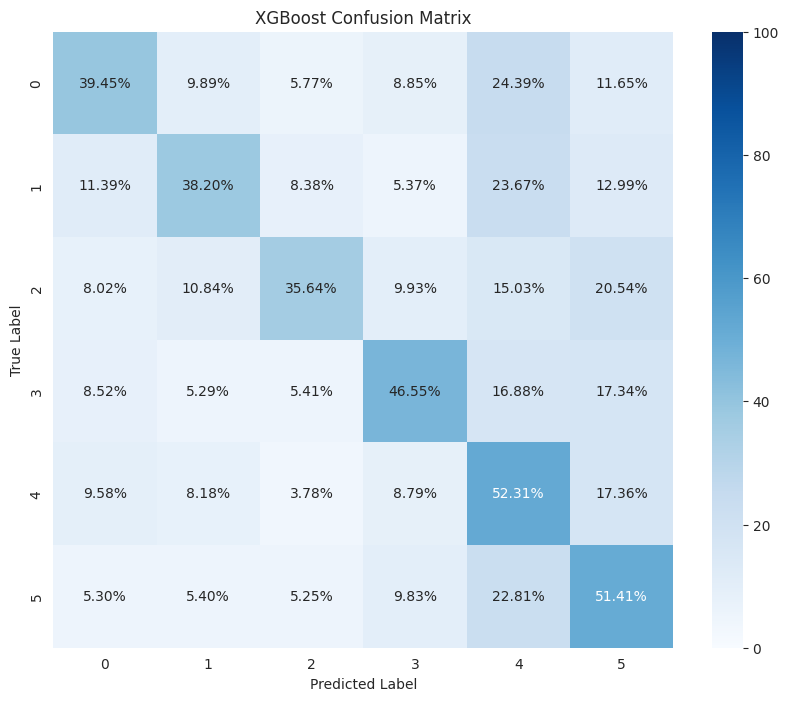

In [104]:
hf.confusion_matrix_plot(y_test_encoded, xgboost.predict(X_test), 'XGBoost', 'Class/XGBoost_cm')

In [105]:
def objective_xgb_class(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.1, 10),
        'subsample': trial.suggest_float('subsample', 0.3, 0.6),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'lambda': trial.suggest_float('lambda', 0, 10),
        'alpha': trial.suggest_float('alpha', 0, 10),
        'objective': 'multi:softmax',
        'num_class': 6,
        'eval_metric': 'mlogloss',
    }
    
    xgboost = XGBClassifier(**params, n_jobs=-1, random_state=33)
    score = cross_val_score(xgboost, X_train, y_train_encoded, cv=3, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [106]:
study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(objective_xgb_class, n_trials=20)

[I 2024-08-06 22:50:12,521] A new study created in memory with name: no-name-d4dea7a6-75ae-4f23-81af-877c05dc533f
[I 2024-08-06 22:53:13,304] Trial 0 finished with value: 0.44554125157318536 and parameters: {'n_estimators': 250, 'max_depth': 7, 'learning_rate': 0.041782149592992264, 'min_child_weight': 9, 'gamma': 1.679393531527519, 'subsample': 0.5431434500853648, 'colsample_bytree': 0.9359468848874635, 'lambda': 6.492524240903842, 'alpha': 7.185527477437118}. Best is trial 0 with value: 0.44554125157318536.
[I 2024-08-06 22:53:37,628] Trial 1 finished with value: 0.3598841529060334 and parameters: {'n_estimators': 100, 'max_depth': 4, 'learning_rate': 0.01744251840853208, 'min_child_weight': 7, 'gamma': 6.442666088417314, 'subsample': 0.42679400221286207, 'colsample_bytree': 0.544522451800107, 'lambda': 1.6240713000747842, 'alpha': 5.4154606739608315}. Best is trial 0 with value: 0.44554125157318536.
[I 2024-08-06 22:54:14,586] Trial 2 finished with value: 0.40417595414638585 and par

In [107]:
print('Best trial:')
trial = study_xgb.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.4504541388042275
Params: 
  n_estimators: 250
  max_depth: 8
  learning_rate: 0.03439932186860596
  min_child_weight: 10
  gamma: 0.733688028970667
  subsample: 0.5973081793949385
  colsample_bytree: 0.7123890866433156
  lambda: 6.331202564975864
  alpha: 3.2921414953952786


In [108]:
trials_df = study_xgb.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_alpha,params_colsample_bytree,params_gamma,params_lambda,params_learning_rate,params_max_depth,params_min_child_weight,params_n_estimators,params_subsample,state
11,11,0.450454,2024-08-06 23:04:34.971809,2024-08-06 23:08:40.161651,0 days 00:04:05.189842,3.292141,0.712389,0.733688,6.331203,0.034399,8,10,250,0.597308,COMPLETE
10,10,0.448453,2024-08-06 23:00:20.903665,2024-08-06 23:04:34.970500,0 days 00:04:14.066835,3.303795,0.726219,0.161632,6.492744,0.032961,8,10,250,0.599333,COMPLETE
12,12,0.448392,2024-08-06 23:08:40.162955,2024-08-06 23:14:07.763302,0 days 00:05:27.600347,3.307367,0.692495,0.141499,5.976695,0.031551,9,10,250,0.599195,COMPLETE
14,14,0.447285,2024-08-06 23:16:38.735122,2024-08-06 23:24:50.902642,0 days 00:08:12.167520,3.418101,0.798177,0.747205,4.683577,0.036211,10,3,250,0.532096,COMPLETE
18,18,0.446876,2024-08-06 23:35:42.883363,2024-08-06 23:39:15.225128,0 days 00:03:32.341765,1.895277,0.701638,3.189835,5.291574,0.040545,9,1,200,0.581665,COMPLETE


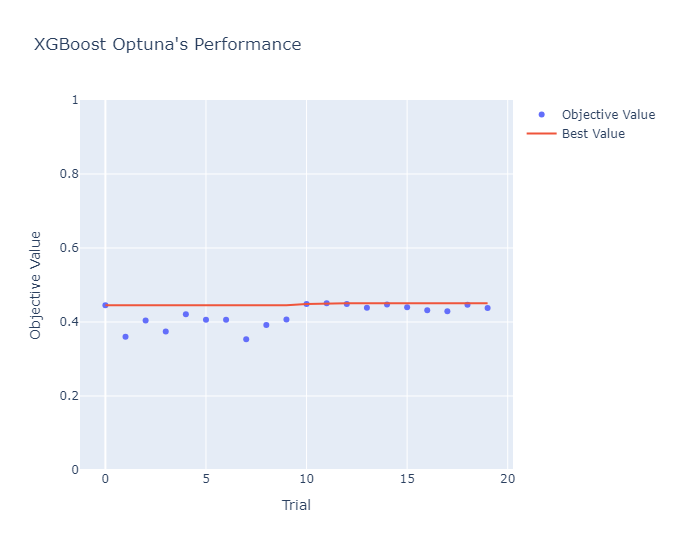

In [109]:
fig = plot_optimization_history(study_xgb)
fig.update_layout(yaxis_range=[0, 1], title="XGBoost Optuna's Performance", width=930, height=550)
fig.show()

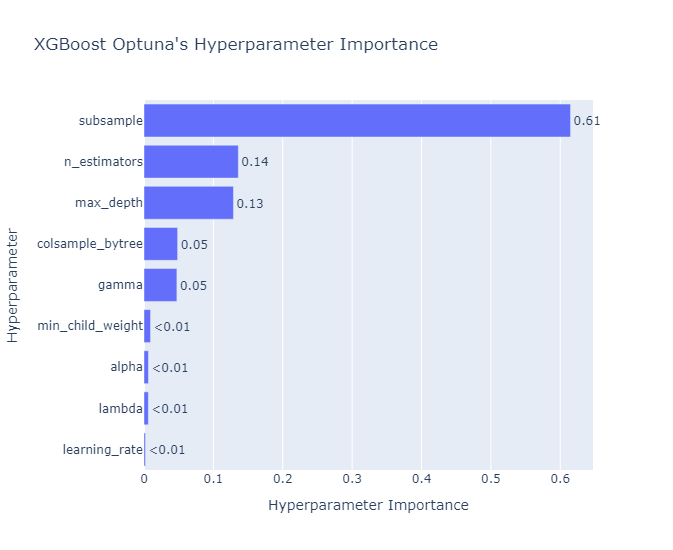

In [110]:
fig = plot_param_importances(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

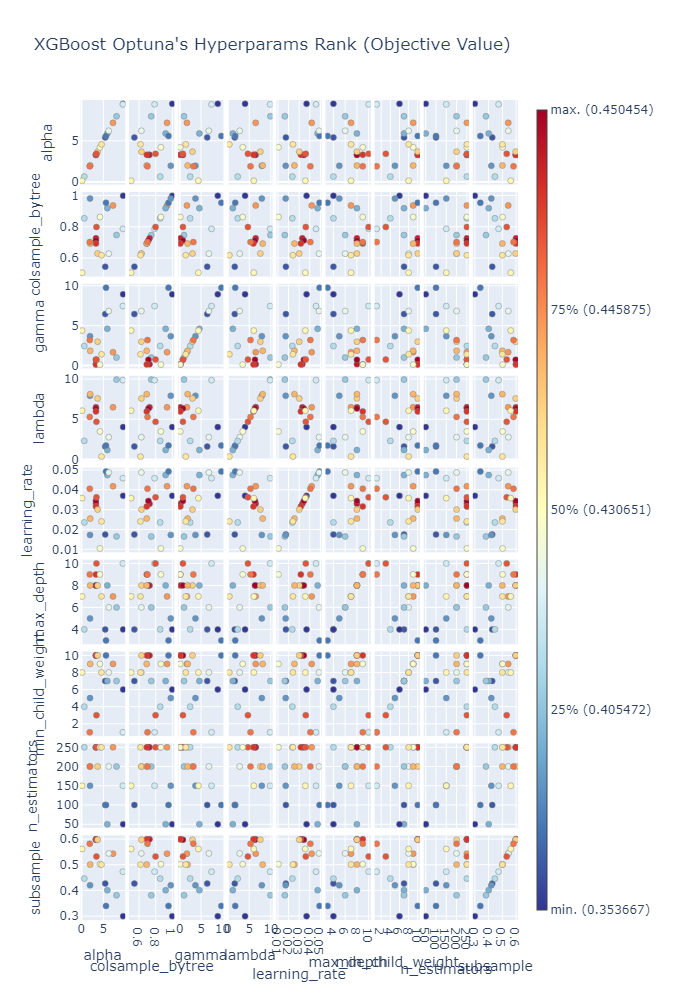

In [111]:
fig = plot_rank(study_xgb)
fig.update_layout(title="XGBoost Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [112]:
xgboost_class = XGBClassifier(**study_xgb.best_trial.params, n_jobs=-1, random_state=33)
xgboost_class.fit(X_train, y_train_encoded)

XGBClassifier(alpha=3.2921414953952786, base_score=None, booster=None,
              callbacks=None, colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=0.7123890866433156, device=None,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0.733688028970667,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, lambda=6.331202564975864,
              learning_rate=0.03439932186860596, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=8, max_leaves=None,
              min_child_weight=10, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=250, n_jobs=-1, ...)

In [113]:
xgboost_class.score(X_test, y_test_encoded)

0.4643198301786662

In [114]:
print(classification_report(y_test_encoded, xgboost_class.predict(X_test)))

              precision    recall  f1-score   support

           0       0.49      0.39      0.43      4317
           1       0.45      0.38      0.41      3819
           2       0.46      0.34      0.39      2980
           3       0.52      0.45      0.48      4365
           4       0.45      0.57      0.50      7028
           5       0.45      0.53      0.49      5756

    accuracy                           0.46     28265
   macro avg       0.47      0.44      0.45     28265
weighted avg       0.47      0.46      0.46     28265



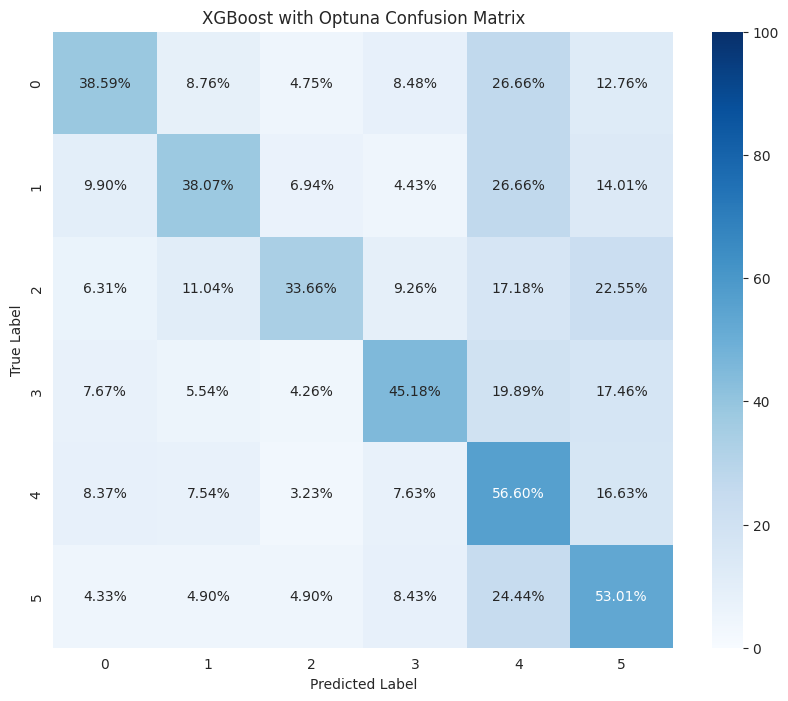

In [115]:
hf.confusion_matrix_plot(y_test_encoded, xgboost_class.predict(X_test), 'XGBoost with Optuna', 'Class/XGBoost_cm_optuna')

### LightGBM

In [116]:
lgbm = LGBMClassifier()
lgbm.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.035782 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 65949, number of used features: 384
[LightGBM] [Info] Start training from score -1.896852
[LightGBM] [Info] Start training from score -2.016519
[LightGBM] [Info] Start training from score -2.262883
[LightGBM] [Info] Start training from score -1.843716
[LightGBM] [Info] Start training from score -1.398822
[LightGBM] [Info] Start training from score -1.571778


LGBMClassifier()

In [117]:
lgbm.score(X_test, y_test)

0.456996285158323

In [118]:
print(classification_report(y_test, lgbm.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.48      0.38      0.42      4317
                         CLASS II WORDS RELATING TO SPACE       0.44      0.38      0.41      3819
                       CLASS III WORDS RELATING TO MATTER       0.44      0.35      0.39      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.52      0.44      0.48      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.44      0.56      0.49      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.44      0.51      0.47      5756

                                                 accuracy                           0.46     28265
                                                macro avg       0.46      0.44      0.44     28265
                                             weighted avg       0.46      0.46      0.45     28265



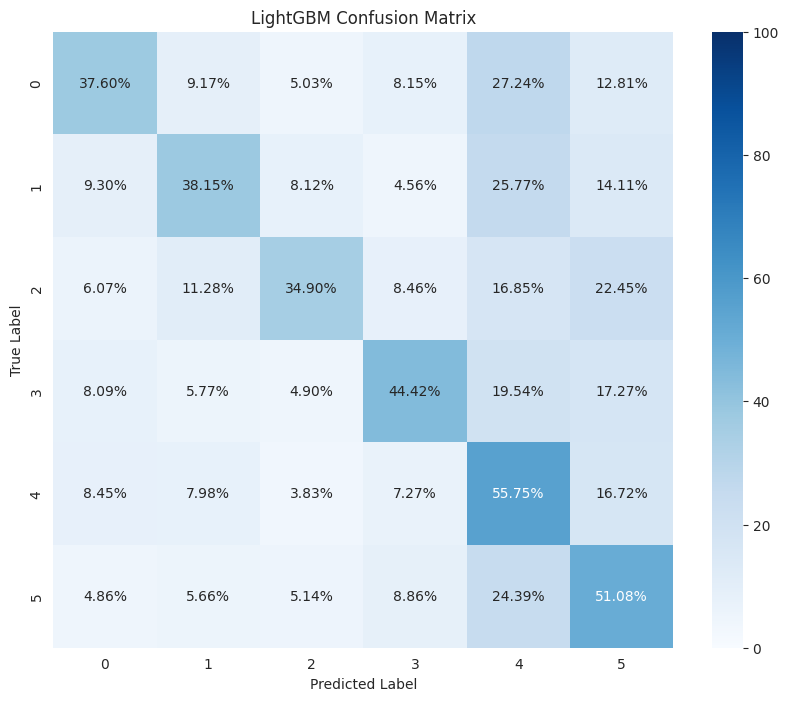

In [119]:
hf.confusion_matrix_plot(y_test, lgbm.predict(X_test), 'LightGBM', 'Class/LightGBM_cm')

In [120]:
def objective_lgbm_class(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',  # Use multi_logloss for multiclass classification
        'num_class': 6,  # Adjust based on your dataset
        'n_estimators': trial.suggest_int('n_estimators', 50, 250, step=50),
        # 'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.05),
        'max_depth': trial.suggest_int('max_depth', -1, 20, 2),  # -1 means no limit
        'num_leaves': trial.suggest_int('num_leaves', 20, 300),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 25),
        'subsample': trial.suggest_float('subsample', 0.2, 0.3),  # Bagging fraction
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.2, 0.3),  # Feature fraction
        # 'reg_alpha': trial.suggest_float('reg_alpha', 0.0, 10.0),  # L1 regularization
        # 'reg_lambda': trial.suggest_float('reg_lambda', 0.0, 10.0),  # L2 regularization
        'n_jobs': -1
    }

    # Create and fit the model
    lgbm = LGBMClassifier(**params)
    score = cross_val_score(lgbm, X_train, y_train, cv=2, scoring='accuracy', n_jobs=-1)
    return score.mean()

In [121]:
study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(objective_lgbm_class, n_trials=10)

[I 2024-08-06 23:43:34,821] A new study created in memory with name: no-name-804239c8-2e0a-41de-8881-cc221a36b989


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.043038 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 32974, number of used features: 384
[LightGBM] [Info] Start training from score -1.896938
[LightGBM] [Info] Start training from score -2.016618
[LightGBM] [Info] Start training from score -2.262868
[LightGBM] [Info] Start training from score -1.843605
[LightGBM] [Info] Start training from score -1.398806
[LightGBM] [Info] Start training from score -1.571763
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[I 2024-08-06 23:44:38,248] Trial 0 finished with value: 0.43583679203588754 and parameters: {'n_estimators': 250, 'max_depth': 5, 'num_leaves': 147, 'min_child_samples': 18, 'subsample': 0.2618592087632958, 'colsample_bytree': 0.2860343455016446}. Best is trial 0 with value: 0.43583679203588754.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.015637 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 32975, number of used features: 384
[LightGBM] [Info] Start training from score -1.896766
[LightGBM] [Info] Start training from score -2.016420
[LightGBM] [Info] Start training from score -2.262898
[LightGBM] [Info] Start training from score -1.843827
[LightGBM] [Info] Start training from score -1.398837
[LightGBM] [Info] Start training from score -1.571793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[I 2024-08-06 23:44:47,511] Trial 1 finished with value: 0.3835994453874634 and parameters: {'n_estimators': 50, 'max_depth': 3, 'num_leaves': 196, 'min_child_samples': 14, 'subsample': 0.27254684821186265, 'colsample_bytree': 0.27149282473763664}. Best is trial 0 with value: 0.43583679203588754.


[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[I 2024-08-06 23:50:07,587] Trial 2 finished with value: 0.4289375004627213 and parameters: {'n_estimators': 200, 'max_depth': -1, 'num_leaves': 224, 'min_child_samples': 25, 'subsample': 0.24758263619117016, 'colsample_bytree': 0.21178014233134482}. Best is trial 0 with value: 0.43583679203588754.
[I 2024-08-06 23:53:10,700] Trial 3 finished with value: 0.42725435248843796 and parameters: {'n_estimators': 100, 'max_depth': 13, 'num_leaves': 232, 'min_child_samples': 21, 'subsample': 0.23861215562140625, 'colsample_bytree': 0.26649661898055144}. Best is trial 0 with value: 0.43583679203588754.
[I 2024-08-06 23:55:10,987] Trial 4 finished with value: 0.4143201533608877 and parameters: {'n_estimators': 50, 'max_depth': 9, 'num_leaves': 261, 'min_child_samples': 5, 'subsample': 0.2000062092647355, 'colsample_bytree': 0.2767439263880191}. Best is trial 0 with value: 0.43583679203588754.
[I 2024-08-06 23:56:23,839] Trial 5 finished with value: 0.43410813344196153 and parameters: {'n_estimat

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.040699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 32975, number of used features: 384
[LightGBM] [Info] Start training from score -1.896766
[LightGBM] [Info] Start training from score -2.016420
[LightGBM] [Info] Start training from score -2.262898
[LightGBM] [Info] Start training from score -1.843827
[LightGBM] [Info] Start training from score -1.398837
[LightGBM] [Info] Start training from score -1.571793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[I 2024-08-06 23:56:52,699] Trial 6 finished with value: 0.42775476697173087 and parameters: {'n_estimators': 250, 'max_depth': 3, 'num_leaves': 123, 'min_child_samples': 6, 'subsample': 0.24390619512001546, 'colsample_bytree': 0.28874068435643413}. Best is trial 0 with value: 0.43583679203588754.


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.032925 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 32975, number of used features: 384
[LightGBM] [Info] Start training from score -1.896766
[LightGBM] [Info] Start training from score -2.016420
[LightGBM] [Info] Start training from score -2.262898
[LightGBM] [Info] Start training from score -1.843827
[LightGBM] [Info] Start training from score -1.398837
[LightGBM] [Info] Start training from score -1.571793
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

[I 2024-08-06 23:57:00,382] Trial 7 finished with value: 0.3498157773857529 and parameters: {'n_estimators': 100, 'max_depth': 1, 'num_leaves': 45, 'min_child_samples': 23, 'subsample': 0.22235063337861832, 'colsample_bytree': 0.28399867732711875}. Best is trial 0 with value: 0.43583679203588754.
[I 2024-08-06 23:58:55,594] Trial 8 finished with value: 0.4262687706761681 and parameters: {'n_estimators': 150, 'max_depth': 17, 'num_leaves': 108, 'min_child_samples': 15, 'subsample': 0.23867937126471908, 'colsample_bytree': 0.22612801365097993}. Best is trial 0 with value: 0.43583679203588754.
[I 2024-08-07 00:01:05,203] Trial 9 finished with value: 0.42567743060181173 and parameters: {'n_estimators': 100, 'max_depth': 11, 'num_leaves': 181, 'min_child_samples': 23, 'subsample': 0.24920596641970058, 'colsample_bytree': 0.2563679599526264}. Best is trial 0 with value: 0.43583679203588754.


In [122]:
print('Best trial:')
trial = study_lgbm.best_trial
print('Score: ', trial.value)
print('Params: ')
for key, value in trial.params.items():
    print(f'  {key}: {value}')

Best trial:
Score:  0.43583679203588754
Params: 
  n_estimators: 250
  max_depth: 5
  num_leaves: 147
  min_child_samples: 18
  subsample: 0.2618592087632958
  colsample_bytree: 0.2860343455016446


In [123]:
trials_df = study_lgbm.trials_dataframe()
trials_df.sort_values(by='value', ascending=False).head()

,number,value,datetime_start,datetime_complete,duration,params_colsample_bytree,params_max_depth,params_min_child_samples,params_n_estimators,params_num_leaves,params_subsample,state
0,0,0.435837,2024-08-06 23:43:34.822038,2024-08-06 23:44:38.248423,0 days 00:01:03.426385,0.286034,5,18,250,147,0.261859,COMPLETE
5,5,0.434108,2024-08-06 23:55:10.987717,2024-08-06 23:56:23.839095,0 days 00:01:12.851378,0.235916,-1,13,250,28,0.246023,COMPLETE
2,2,0.428938,2024-08-06 23:44:47.512510,2024-08-06 23:50:07.587564,0 days 00:05:20.075054,0.211780,-1,25,200,224,0.247583,COMPLETE
6,6,0.427755,2024-08-06 23:56:23.840237,2024-08-06 23:56:52.699042,0 days 00:00:28.858805,0.288741,3,6,250,123,0.243906,COMPLETE
3,3,0.427254,2024-08-06 23:50:07.588455,2024-08-06 23:53:10.700030,0 days 00:03:03.111575,0.266497,13,21,100,232,0.238612,COMPLETE


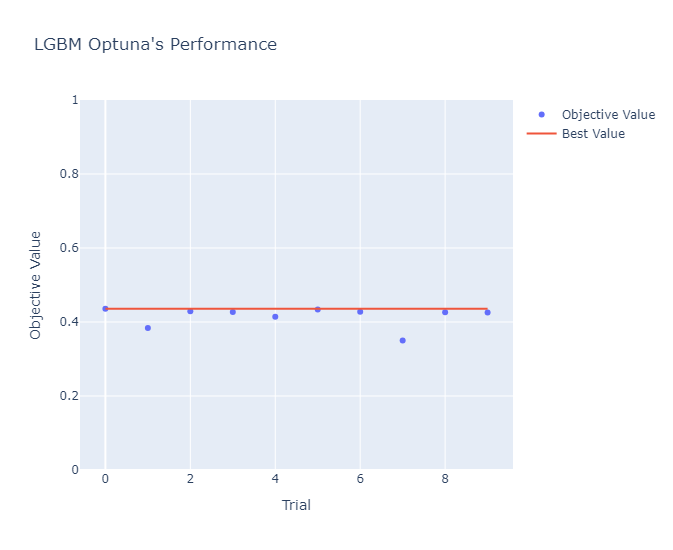

In [124]:
fig = plot_optimization_history(study_lgbm)
fig.update_layout(yaxis_range=[0, 1], title="LGBM Optuna's Performance", width=930, height=550)
fig.show()

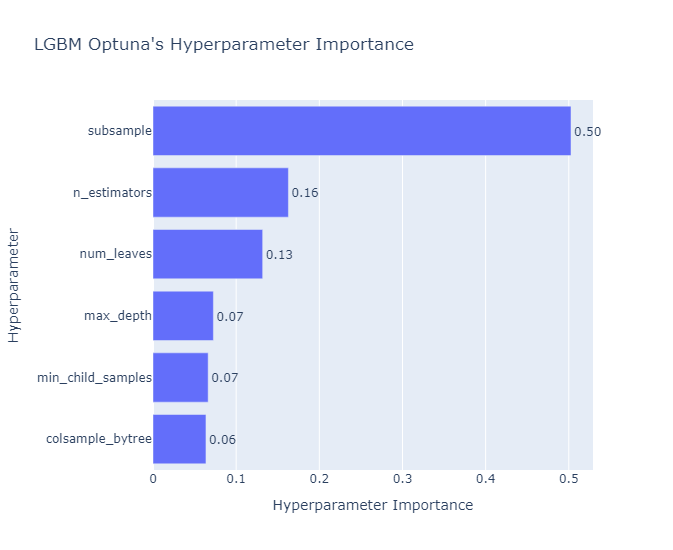

In [125]:
fig = plot_param_importances(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparameter Importance", width=730, height=550)
fig.show()

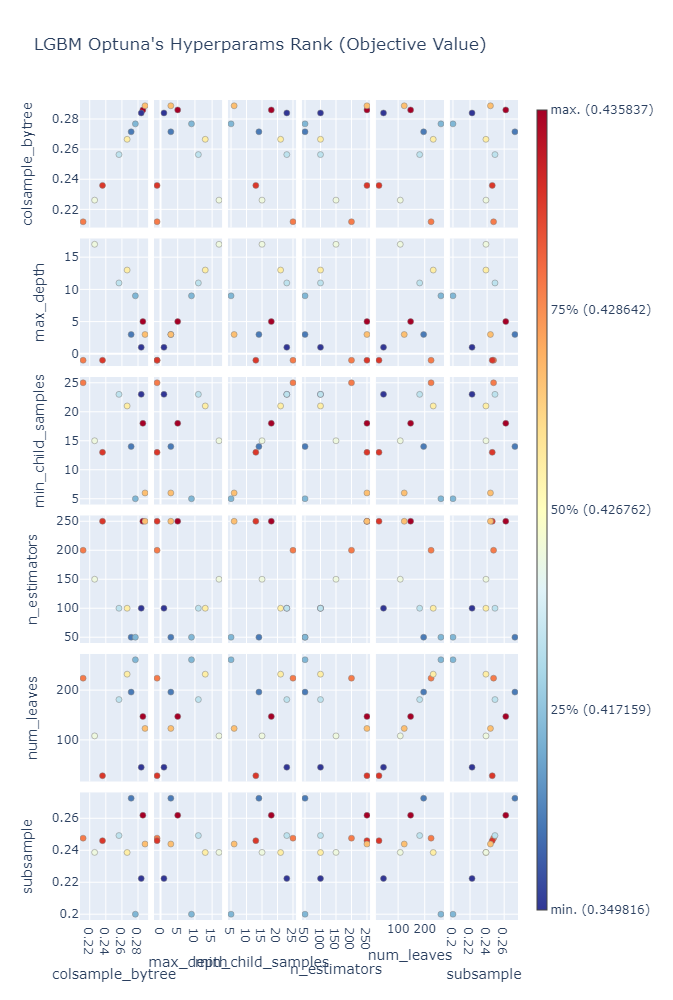

In [126]:
fig = plot_rank(study_lgbm)
fig.update_layout(title="LGBM Optuna's Hyperparams Rank (Objective Value)", width=930, height=1000)
fig.show()

In [127]:
lgbm_class = LGBMClassifier(**study_lgbm.best_trial.params)
lgbm_class.fit(X_train, y_train)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.028511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 97920
[LightGBM] [Info] Number of data points in the train set: 65949, number of used features: 384
[LightGBM] [Info] Start training from score -1.896852
[LightGBM] [Info] Start training from score -2.016519
[LightGBM] [Info] Start training from score -2.262883
[LightGBM] [Info] Start training from score -1.843716
[LightGBM] [Info] Start training from score -1.398822
[LightGBM] [Info] Start training from score -1.571778
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM]

LGBMClassifier(colsample_bytree=0.2860343455016446, max_depth=5,
               min_child_samples=18, n_estimators=250, num_leaves=147,
               subsample=0.2618592087632958)

In [128]:
lgbm_class.score(X_test, y_test)

0.46683177074119936

In [129]:
print(classification_report(y_test, lgbm_class.predict(X_test)))

                                                           precision    recall  f1-score   support

              CLASS I WORDS EXPRESSING ABSTRACT RELATIONS       0.48      0.39      0.43      4317
                         CLASS II WORDS RELATING TO SPACE       0.45      0.40      0.42      3819
                       CLASS III WORDS RELATING TO MATTER       0.45      0.37      0.41      2980
    CLASS IV WORDS RELATING TO THE INTELLECTUAL FACULTIES       0.51      0.47      0.49      4365
           CLASS V WORDS RELATING TO THE VOLUNTARY POWERS       0.46      0.54      0.50      7028
CLASS VI WORDS RELATING TO THE SENTIMENT AND MORAL POWERS       0.46      0.52      0.49      5756

                                                 accuracy                           0.47     28265
                                                macro avg       0.47      0.45      0.46     28265
                                             weighted avg       0.47      0.47      0.46     28265



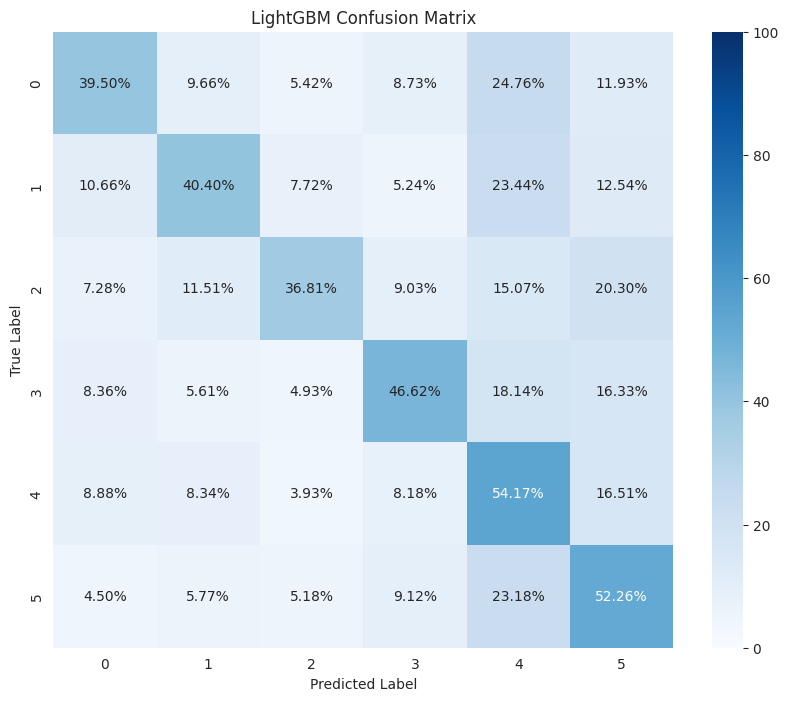

In [130]:
hf.confusion_matrix_plot(y_test, lgbm_class.predict(X_test), 'LightGBM', 'Class/LightGBM_cm_optuna')

## 5. ML Comparison

In [131]:
dump(lgbm_class, 'Models/Class/lgbm.joblib')

['Models/Class/lgbm.joblib']

In [133]:
dump(xgboost_class, 'Models/Class/xgboost.joblib')

['Models/Class/xgboost.joblib']

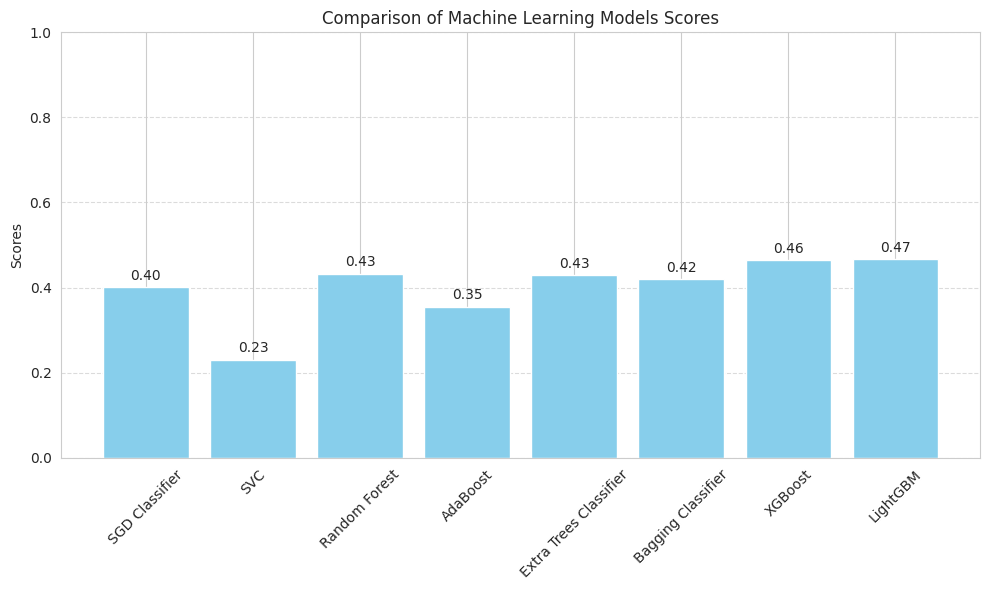

In [138]:
model_objects = {
    'SGD Classifier': sgd_class,
    'SVC': svc_class,
    'Random Forest': rf_class,
    'AdaBoost': adaboost_class,
    'Extra Trees Classifier': etc_class,
    'Bagging Classifier': bgc_class,
    'XGBoost': xgboost_class,
    'LightGBM': lgbm_class
}

# Extract scores for each model
model_names = []
scores = []

for model_name, model in model_objects.items():
    if model_name != 'XGBoost':
        score = model.score(X_test, y_test)
        model_names.append(model_name)
        scores.append(score)
    else:
        score = model.score(X_test, y_test_encoded)
        model_names.append(model_name)
        scores.append(score)

# Create a bar chart
plt.figure(figsize=(10, 6))
plt.bar(model_names, scores, color='skyblue')
plt.xlabel(None)
plt.ylabel('Scores')
plt.title('Comparison of Machine Learning Models Scores')
plt.ylim(0, 1)  # Assuming scores are between 0 and 1
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add score values on top of the bars
for i, score in enumerate(scores):
    plt.text(i, score + 0.01, f'{score:.2f}', ha='center', va='bottom')

plt.tight_layout()
plt.savefig('Figures/Modeling Class/Machine_Learning_results.png')
plt.show()

## 6. Deep Learning

* Set up mix precision before modeling to speed up the training

In [13]:
!nvidia-smi -L

GPU 0: NVIDIA GeForce RTX 3060 (UUID: GPU-ab9b9fbd-4e42-e44a-c243-d1a9ea6686fe)


In [14]:
tf.config.list_physical_devices()

2024-09-11 18:10:24.642601: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-09-11 18:10:24.727152: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.
2024-09-11 18:10:24.727205: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


[PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'),
 PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [15]:
mixed_precision.set_global_policy(policy='mixed_float16')

INFO:tensorflow:Mixed precision compatibility check (mixed_float16): OK
Your GPU will likely run quickly with dtype policy mixed_float16 as it has compute capability of at least 7.0. Your GPU: NVIDIA GeForce RTX 3060, compute capability 8.6


2024-09-11 18:10:24.734221: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:887] could not open file to read NUMA node: /sys/bus/pci/devices/0000:01:00.0/numa_node
Your kernel may have been built without NUMA support.


In [16]:
mixed_precision.global_policy()

<Policy "mixed_float16">

* Initialize fixed variables needed

In [17]:
# Initialize parameters for our models
embedding_dim = d_st
output_dim = 6
batch_size = 33

* Encode the y datasets

In [18]:
# Create an instance of LabelEncoder
label_encoder = LabelEncoder()

# Fit the label encoder and transform the labels to integer indices
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Convert integer labels to one-hot encoded labels
y_train_categorical = to_categorical(y_train_encoded, num_classes=output_dim)
y_test_categorical = to_categorical(y_test_encoded, num_classes=output_dim)

* Initialize callbacks

In [19]:
reduce_lr = ReduceLROnPlateau(monitor='val_accuracy', factor=0.8, patience=3, min_lr=1e-6)

### LSTM

In [146]:
# Input layer
input_layer = Input(shape=(embedding_dim), name='Input')
reshaped_input = Reshape((1, embedding_dim), name='Reshape_Layer')(input_layer)

# First Bidirectional LSTM layer
bi_lstm_1 = Bidirectional(
                LSTM(units=64,
                     kernel_regularizer=l2(0.01),
                     recurrent_regularizer=l2(0.01),
                     return_sequences=True),
                name='Bidirectional_LSTM_1')(reshaped_input)
dropout_1 = Dropout(0.2, name='Dropout_1')(bi_lstm_1)
batch_norm_1 = BatchNormalization(name='BatchNorm_1')(dropout_1)

# Second LSTM layer with residual connection
lstm_layer_2 = LSTM(units=128,
                    kernel_regularizer=l2(0.01),
                    recurrent_regularizer=l2(0.01),
                    return_sequences=True,
                    name='LSTM_2')(batch_norm_1)
dropout_2 = Dropout(0.2, name='Dropout_2')(lstm_layer_2)
residual_1 = Add(name='Residual_1')([batch_norm_1, dropout_2])

# Third GRU layer
gru_layer = GRU(units=64, return_sequences=False, name='GRU_3')(residual_1)
dropout_3 = Dropout(0.2, name='Dropout_3')(gru_layer)
layer_norm_1 = LayerNormalization(name='LayerNorm_1')(dropout_3)

# Dense layers
dense_1 = Dense(units=64, activation='relu', name='Dense_1')(layer_norm_1)
dropout_4 = Dropout(0.2, name='Dropout_4')(dense_1)
dense_2 = Dense(units=64, activation='relu', name='Dense_2')(dropout_4)
residual_2 = Add(name='Residual_2')([dropout_4, dense_2])

# Output layer
output_layer = Dense(units=output_dim, activation='softmax', name='Output_Layer')(residual_2)

In [147]:
lstm = Model(inputs=input_layer, outputs=output_layer, name='Complex_LSTM_Model')
lstm.compile(optimizer=tf.keras.optimizers.AdamW(),
              loss=tf.keras.losses.CategoricalFocalCrossentropy(),
              metrics=['accuracy'])

In [148]:
lstm.summary()

Model: "Complex_LSTM_Model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 Input (InputLayer)          [(None, 384)]                0         []                            
                                                                                                  
 Reshape_Layer (Reshape)     (None, 1, 384)               0         ['Input[0][0]']               
                                                                                                  
 Bidirectional_LSTM_1 (Bidi  (None, 1, 128)               229888    ['Reshape_Layer[0][0]']       
 rectional)                                                                                       
                                                                                                  
 Dropout_1 (Dropout)         (None, 1, 128)               0         ['Bidirection

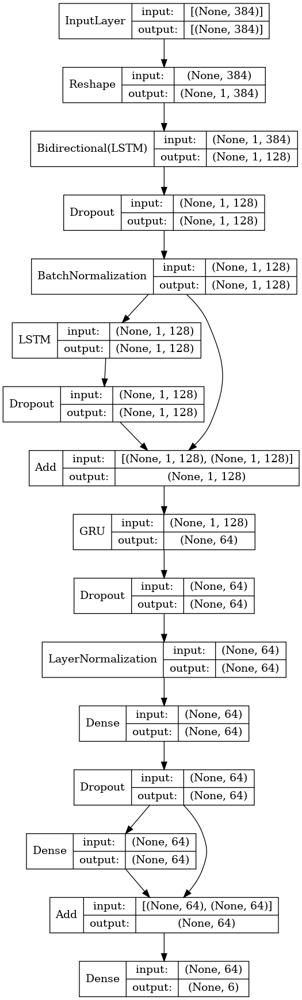

In [149]:
plot_model(lstm, to_file='Models Architecture/Bidirectional_LSTM.png', show_shapes=True, show_layer_names=False)

In [150]:
lstm_history = lstm.fit(X_train,
                        y_train_categorical,
                        epochs=50,
                        batch_size=batch_size,
                        validation_split=0.2,
                        callbacks=[reduce_lr])

Epoch 1/50


2024-09-11 01:39:02.000605: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2024-09-11 01:39:03.573884: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f0d2cbff1c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-09-11 01:39:03.573914: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA GeForce RTX 3060, Compute Capability 8.6
2024-09-11 01:39:03.594584: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1726007943.699125   66423 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1599/1599 [==============================] - 49s 27ms/step - loss: 0.7011 - accuracy: 0.3472 - val_loss: 0.3075 - val_accuracy: 0.3851 - lr: 0.0010
Epoch 2/50
1599/1599 [==============================] - 42s 26ms/step - loss: 0.3105 - accuracy: 0.3751 - val_loss: 0.3029 - val_accuracy: 0.3831 - lr: 0.0010
Epoch 3/50
1599/1599 [==============================] - 41s 26ms/step - loss: 0.3073 - accuracy: 0.3748 - val_loss: 0.2959 - val_accuracy: 0.3934 - lr: 0.0010
Epoch 4/50
1599/1599 [==============================] - 43s 27ms/step - loss: 0.3060 - accuracy: 0.3752 - val_loss: 0.3010 - val_accuracy: 0.3829 - lr: 0.0010
Epoch 5/50
1599/1599 [==============================] - 41s 26ms/step - loss: 0.3046 - accuracy: 0.3743 - val_loss: 0.2974 - val_accuracy: 0.3859 - lr: 0.0010
Epoch 6/50
1599/1599 [==============================] - 41s 26ms/step - loss: 0.3019 - accuracy: 0.3758 - val_loss: 0.2958 - val_accuracy: 0.3810 - lr: 0.0010
Epoch 7/50
1599/1599 [==============================] - 4

In [151]:
lstm.evaluate(X_test, y_test_categorical)

884/884 [==============================] - 7s 8ms/step - loss: 0.2343 - accuracy: 0.4388


[0.2342715859413147, 0.4388112425804138]

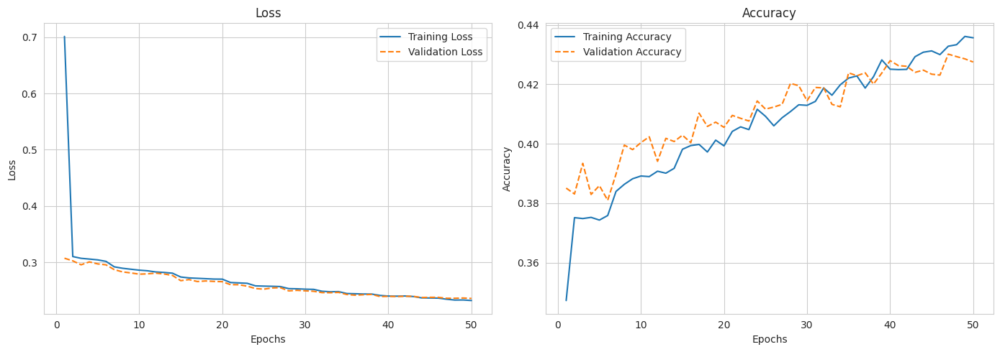

In [152]:
hf.plot_history(lstm_history, 'Modeling Class/Bidirectional_LSTM_history')

In [153]:
hf.class_report(lstm, X_test, y_test_categorical)

884/884 [==============================] - 6s 6ms/step
              precision    recall  f1-score   support

           0       0.47      0.37      0.41      4317
           1       0.37      0.46      0.41      3819
           2       0.41      0.39      0.40      2980
           3       0.50      0.43      0.46      4365
           4       0.45      0.49      0.47      7028
           5       0.43      0.45      0.44      5756

    accuracy                           0.44     28265
   macro avg       0.44      0.43      0.43     28265
weighted avg       0.44      0.44      0.44     28265



### Transformers

In [54]:
num_transformer_blocks = 3
num_heads = 4
ffn_units = 64

In [55]:
# Input
input_layer = Input(shape=(embedding_dim,), name='InputLayer')

# Expand dimensions to simulate sequence for attention
x = tf.expand_dims(input_layer, axis=1)
x = tf.cast(x, dtype=tf.float16)

# Transformer Encoder Blocks
for i in range(num_transformer_blocks):
    x = hf.transformer_block(x, num_heads, embedding_dim, ffn_units, block_name=f'Block_{i+1}')

#Remove the sequence dimension (back to original shape)
x = tf.squeeze(x, axis=1)

# Output 
output_layer = Dense(output_dim, activation='softmax', name='OutputLayer')(x)

In [56]:
# Initialize the model
transformer = Model(inputs=input_layer, outputs=output_layer, name='Transformer_Model')

# Compile the model
transformer.compile(optimizer=tf.keras.optimizers.AdamW(),
              loss=tf.keras.losses.CategoricalFocalCrossentropy(),
              metrics=['accuracy'])

In [57]:
transformer.summary()

Model: "Transformer_Model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 InputLayer (InputLayer)     [(None, 384)]                0         []                            
                                                                                                  
 tf.expand_dims_4 (TFOpLamb  (None, 1, 384)               0         ['InputLayer[0][0]']          
 da)                                                                                              
                                                                                                  
 tf.cast_4 (TFOpLambda)      (None, 1, 384)               0         ['tf.expand_dims_4[0][0]']    
                                                                                                  
 MultiHeadAttention_Block_1  (None, 1, 384)               2364288   ['tf.cast_4[0]

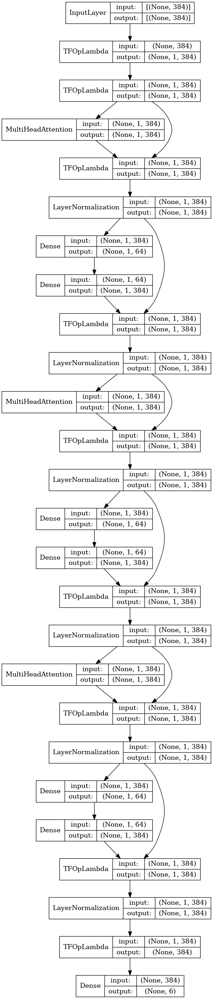

In [58]:
plot_model(transformer, to_file='Models Architecture/Transformer.png', show_shapes=True, show_layer_names=False)

In [59]:
transformer_history = transformer.fit(X_train,
                                      y_train_categorical,
                                      epochs=20,
                                      batch_size=batch_size,
                                      validation_split=0.2,
                                      callbacks=[reduce_lr])

Epoch 1/20
1599/1599 [==============================] - 57s 33ms/step - loss: 0.2692 - accuracy: 0.3581 - val_loss: 0.2540 - val_accuracy: 0.3788 - lr: 0.0010
Epoch 2/20
1599/1599 [==============================] - 51s 32ms/step - loss: 0.2452 - accuracy: 0.3946 - val_loss: 0.2451 - val_accuracy: 0.4044 - lr: 0.0010
Epoch 3/20
1599/1599 [==============================] - 54s 34ms/step - loss: 0.2386 - accuracy: 0.4085 - val_loss: 0.2405 - val_accuracy: 0.4076 - lr: 0.0010
Epoch 4/20
1599/1599 [==============================] - 50s 31ms/step - loss: 0.2346 - accuracy: 0.4200 - val_loss: 0.2385 - val_accuracy: 0.4069 - lr: 0.0010
Epoch 5/20
1599/1599 [==============================] - 52s 32ms/step - loss: 0.2311 - accuracy: 0.4246 - val_loss: 0.2336 - val_accuracy: 0.4208 - lr: 0.0010
Epoch 6/20
1599/1599 [==============================] - 51s 32ms/step - loss: 0.2283 - accuracy: 0.4289 - val_loss: 0.2348 - val_accuracy: 0.4194 - lr: 0.0010
Epoch 7/20
1599/1599 [========================

In [60]:
transformer.evaluate(X_test, y_test_categorical)

884/884 [==============================] - 9s 10ms/step - loss: 0.2301 - accuracy: 0.4334


[0.23011678457260132, 0.43339818716049194]

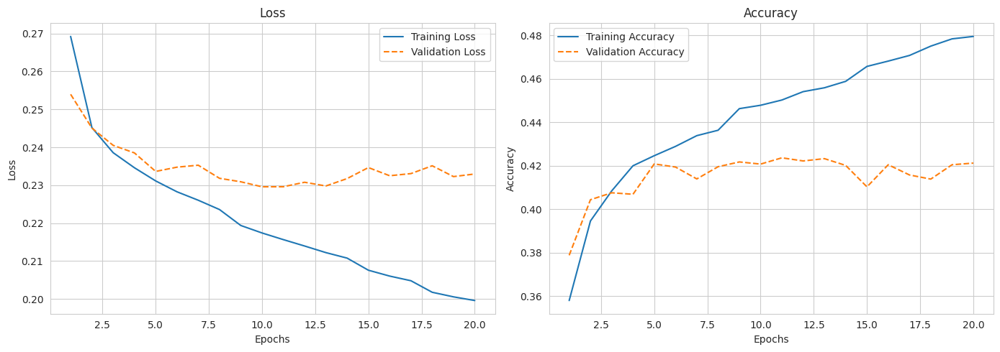

In [61]:
hf.plot_history(transformer_history, 'Modeling Class/Transformer_history')

In [62]:
hf.class_report(transformer, X_test, y_test_categorical)

884/884 [==============================] - 8s 9ms/step
              precision    recall  f1-score   support

           0       0.44      0.38      0.41      4317
           1       0.37      0.43      0.40      3819
           2       0.38      0.40      0.39      2980
           3       0.49      0.44      0.46      4365
           4       0.44      0.51      0.47      7028
           5       0.47      0.39      0.43      5756

    accuracy                           0.43     28265
   macro avg       0.43      0.43      0.43     28265
weighted avg       0.44      0.43      0.43     28265

